In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Union
import shap
import torch.nn.functional as F
from captum.attr import (
    IntegratedGradients,
    GuidedGradCam,
    LayerGradCam,
    LayerAttribution
)
from tqdm import tqdm
from models.model import MiniUnet
from models.xrd_transformer import XRDTransformer
from models.xrd_transformer import MultiHeadSelfAttention3D
class ModelAnalyzer:
    def __init__(self, model: Union[MiniUnet, XRDTransformer], weights_path: str = None, device: str = 'cuda'):
        """Initialize model analyzer.
        
        Args:
            model: Model instance (UNet or XRDTransformer)
            weights_path: Path to model weights file
            device: Device to run model on
        """
        self.model = model.to(device)
    
    # Load weights if provided
        if weights_path:
            state_dict = {}
            state_old = torch.load(weights_path)['state_dict']
            for key in state_old.keys():
                key_new = key[6:]  # Remove 'model.' prefix
                state_dict[key_new] = state_old[key]
            self.model.load_state_dict(state_dict, strict=True)
            print('Model weights loaded successfully')
        
        self.device = device
        self.model.eval()
        
    def analyze_attention_patterns(self, input_tensor):
        """Analyze attention patterns (for XRDTransformer only)"""
        if not hasattr(self.model, 'transformer_blocks'):
            raise ValueError("This method is only for XRDTransformer model")
            
        attentions = []
        
        def hook_fn(module, input, output):
            # Get attention weights from the attention module
            if isinstance(module, MultiHeadSelfAttention3D):
                # Calculate attention weights
                B_, N, C = input[0].shape
                qkv = module.qkv(input[0]).reshape(B_, N, 3, module.num_heads, C // module.num_heads).permute(2, 0, 3, 1, 4)
                q, k, v = qkv.unbind(0)
                
                # Calculate attention scores
                attn = (q @ k.transpose(-2, -1)) * module.scale
                attn = attn.softmax(dim=-1)
                attentions.append(attn.detach().cpu())
        
        # Register hooks for attention modules
        hooks = []
        for block in self.model.transformer_blocks:
            hooks.append(block.attn.register_forward_hook(hook_fn))
            
        # Forward pass
        with torch.no_grad():
            _ = self.model(input_tensor.to(self.device))
            
        # Remove hooks
        for hook in hooks:
            hook.remove()
            
        return attentions
    
    def visualize_feature_maps(self, input_tensor, layer_idx: int = -1):
        """Visualize feature maps from intermediate layers"""
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.detach().cpu())
            
        # For MiniUnet
        if isinstance(self.model, MiniUnet):
            if layer_idx == 0:
                hook = self.model.down_blocks[0].double_conv.register_forward_hook(hook_fn)
            elif layer_idx == 1:
                hook = self.model.down_blocks[1].double_conv.register_forward_hook(hook_fn)
            elif layer_idx == -1:
                hook = self.model.conv_last.register_forward_hook(hook_fn)
        # For XRDTransformer
        elif hasattr(self.model, 'transformer_blocks'):
            hook = self.model.transformer_blocks[layer_idx].register_forward_hook(hook_fn)
        else:
            raise ValueError("Unsupported model type")
            
        with torch.no_grad():
            _ = self.model(input_tensor.to(self.device))
        # Remove hook
        hook.remove()
            
        if not feature_maps:
            raise ValueError(f"No feature maps were captured for layer_idx {layer_idx}")
        return feature_maps[0]
    
    def analyze_frequency_response(self, input_tensor):
        """Analyze frequency response of the model"""
        with torch.no_grad():
            # Move input to device and compute FFT
            input_tensor = input_tensor.to(self.device)
            input_fft = torch.fft.rfftn(input_tensor, dim=(-3, -2, -1))
            
            # Get model output and compute FFT
            output = self.model(input_tensor)
            output_fft = torch.fft.rfftn(output, dim=(-3, -2, -1))
            
            # Compute magnitude spectra
            input_spectrum = torch.abs(input_fft)
            output_spectrum = torch.abs(output_fft)
            
            # Compute transfer function (all tensors are now on GPU)
            transfer_function = output_spectrum / (input_spectrum + 1e-8)
            
            # Move results back to CPU only when returning
            return {
                'input_spectrum': input_spectrum.cpu(),
                'output_spectrum': output_spectrum.cpu(),
                'transfer_function': transfer_function.cpu()
            }
    
    def compute_sensitivity(self, input_tensor, n_samples: int = 10, noise_std: float = 0.1):
        """Analyze model sensitivity to input perturbations"""
        sensitivities = []
        base_output = None
        
        with torch.no_grad():
            # Get base output
            base_output = self.model(input_tensor.to(self.device))
            
            # Add noise multiple times and compute differences
            for _ in range(n_samples):
                noise = torch.randn_like(input_tensor) * noise_std
                noisy_input = input_tensor + noise
                noisy_output = self.model(noisy_input.to(self.device))
                
                # Compute relative change
                sensitivity = torch.abs(noisy_output - base_output) / (torch.abs(base_output) + 1e-8)
                sensitivities.append(sensitivity.cpu())
                
        return torch.stack(sensitivities).mean(dim=0)
    
    def plot_analysis(self, analysis_type: str, data, save_path: str = None):
        """Utility method to plot analysis results"""
        plt.figure(figsize=(12, 8))
        
        if analysis_type == 'attention':
            # Plot attention heatmap
            sns.heatmap(data[0][0].mean(0), cmap='viridis')
            plt.title('Attention Pattern')
            
        elif analysis_type == 'feature_maps':
            # Plot first few feature maps
            n_maps = data.shape[1]#min(16, data.shape[1])
            fig, axes = plt.subplots(n_maps//4, 4, figsize=(15, 15))
            for idx in range(n_maps):
                ax = axes[idx//4, idx%4]
                ax.imshow(data[0, idx].sum(-1))
                ax.axis('off')
            plt.suptitle('Feature Maps')
            
        elif analysis_type == 'frequency':
            # Plot transfer function
            plt.imshow(data['transfer_function'][0, 0].mean(-1))
            plt.colorbar()
            plt.title('Transfer Function')
            
        elif analysis_type == 'sensitivity':
            # Plot sensitivity map
            plt.imshow(data[0, 0].mean(-1))
            plt.colorbar()
            plt.title('Sensitivity Map')
            
        if save_path:
            plt.savefig(save_path)
        plt.show()

    def compute_shap_values(self, background_data, test_sample):
        """
        Compute SHAP values for the model predictions
        
        Args:
            background_data: Tensor of shape [N, C, H, W, D] for background distribution
            test_sample: Single sample to explain [1, C, H, W, D]
        """
        self.model.eval()
        
        # Create a wrapper model that returns scalar output
        class WrapperModel(torch.nn.Module):
            def __init__(self, base_model):
                super().__init__()
                self.base_model = base_model
                
            def forward(self, x):
                output = self.base_model(x)
                # Apply ReLU to match the model's behavior
                output = torch.nn.functional.relu(output)
                batch_size = output.shape[0]
                # Take mean of absolute values to get a more stable scalar output
                return output.abs().view(batch_size, -1).mean(dim=1)
        
        wrapped_model = WrapperModel(self.model)
        
        try:
            # Initialize the SHAP explainer with wrapped model
            explainer = shap.DeepExplainer(
                model=wrapped_model,
                data=background_data.to(self.device)
            )
            
            # Calculate SHAP values with additivity check disabled
            shap_values = explainer.shap_values(
                test_sample.to(self.device),
                check_additivity=False  # Disable additivity check
            )
            
            return shap_values
            
        except Exception as e:
            print(f"Warning: SHAP computation failed with error: {str(e)}")
            # Return None or empty tensor if SHAP computation fails
            return None

    def compute_integrated_gradients(self, input_tensor, target_class=None, n_steps=50):
        """
        Compute Integrated Gradients attribution
        
        Args:
            input_tensor: Input to analyze
            target_class: Target class index. If None, will use mean across all outputs
            n_steps: Number of steps for integral approximation
        """
        self.model.eval()
        
        # Create a wrapper that reduces multiple outputs to a scalar
        class WrapperModel(torch.nn.Module):
            def __init__(self, base_model):
                super().__init__()
                self.base_model = base_model
                
            def forward(self, x):
                output = self.base_model(x)
                # Take mean across all dimensions except batch
                return output.mean(dim=tuple(range(1, output.dim())))
        
        wrapped_model = WrapperModel(self.model)
        ig = IntegratedGradients(wrapped_model)
        
        # Define baseline (usually zeros)
        baseline = torch.zeros_like(input_tensor).to(self.device)
        
        attributions = ig.attribute(
            input_tensor.to(self.device),
            baseline,
            target=target_class,
            n_steps=n_steps
        )
        
        return attributions.cpu()

    def compute_gradcam(self, input_tensor, target_layer, target_class=None):
        """
        Compute GradCAM attribution for a specific layer
        """
        self.model.eval()
        
        # Create wrapper model for multiple outputs
        class WrapperModel(torch.nn.Module):
            def __init__(self, base_model):
                super().__init__()
                self.base_model = base_model
                
            def forward(self, x):
                output = self.base_model(x)
                return output.mean(dim=tuple(range(1, output.dim())))
        
        wrapped_model = WrapperModel(self.model)
        
        # Get target layer based on model type
        if isinstance(self.model, MiniUnet):
            if target_layer == 'down1':
                layer = self.model.down_blocks[0].double_conv
            elif target_layer == 'down2':
                layer = self.model.down_blocks[1].double_conv
            elif target_layer == 'bottleneck':
                layer = self.model.double_conv
            else:
                raise ValueError(f"Invalid target layer {target_layer} for UNet")
                
        elif isinstance(self.model, XRDTransformer):
            if not isinstance(target_layer, int):
                raise ValueError("Target layer should be integer index for Transformer")
            layer = self.model.transformer_blocks[target_layer]
        else:
            raise ValueError("Unsupported model type")
        
        grad_cam = LayerGradCam(wrapped_model, layer)
        attribution = grad_cam.attribute(
            input_tensor.to(self.device),
            target=target_class
        )
        
        return attribution.cpu()

    def plot_shap_summary(self, shap_values, feature_names=None, save_path=None):
        """Plot SHAP summary plot"""
        if shap_values is None:
            print("Warning: No SHAP values available to plot")
            return
            
        plt.figure(figsize=(10, 6))
        try:
            shap.summary_plot(shap_values, feature_names=feature_names)
            if save_path:
                plt.savefig(save_path)
            plt.show()
        except Exception as e:
            print(f"Warning: Failed to create SHAP summary plot: {str(e)}")

    def plot_feature_importance(self, importance_scores, feature_names=None, save_path=None):
        """Plot feature importance scores"""
        plt.figure(figsize=(12, 6))
        features = feature_names if feature_names else list(importance_scores.keys())
        scores = list(importance_scores.values())
        
        sns.barplot(x=features, y=scores)
        plt.xticks(rotation=45)
        plt.title('Feature Importance Scores')
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path)
        plt.show()

    def plot_attribution_overlay(self, input_tensor, attribution, save_path=None):
        """Plot attribution overlay on input"""
        plt.figure(figsize=(15, 5))
        
        # Plot original input
        plt.subplot(131)
        plt.imshow(input_tensor[0, 0].mean(-1).detach().cpu())
        plt.title('Original Input')
        plt.colorbar()
        
        # Plot attribution
        plt.subplot(132)
        plt.imshow(attribution[0, 0].mean(-1).detach().cpu())
        plt.title('Attribution')
        plt.colorbar()
        
        # Plot overlay
        plt.subplot(133)
        attr_normalized = (attribution[0, 0].mean(-1).detach().cpu() - attribution[0, 0].mean(-1).detach().cpu().min()) / \
                        (attribution[0, 0].mean(-1).detach().cpu().max() - attribution[0, 0].mean(-1).detach().cpu().min())
        plt.imshow(input_tensor[0, 0].mean(-1).detach().cpu())
        plt.imshow(attr_normalized, alpha=0.5, cmap='jet')
        plt.title('Overlay')
        plt.colorbar()
        
        plt.tight_layout()
        if save_path:
            plt.savefig(save_path)
        plt.show()

/home/arthur/miniconda3/envs/cuda-no-cctbx/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Example usage
model = MiniUnet(2)  # or XRDTransformer()
model = XRDTransformer(
            input_shape=(26, 18, 23),
            embed_dim=128,
            depth=5,
            num_heads=4,
            mlp_ratio=4,
            drop_rate=0.1,
            attn_drop_rate=0.1,
    embedding_type='onehot'
).cuda()
analyzer = ModelAnalyzer(
    model=model,
    weights_path="weights/XRDTransformer/model.ckpt",
    device='cuda'
)

Model weights loaded successfully


/tmp/ipykernel_4758/3184697234.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_old = torch.load(weights_path)['state_dict']


In [3]:
file = np.load('87145.npz', allow_pickle=True)
intensity = file['Intensity']
ind_high = file['Ind_high']
ind_low = file['Ind_low']

In [4]:
laue_types = {
            'romb': {'h': [0, 16], 'k': [0, 21], 'l': [0, 28]},
            'clin': {'h': [-13, 12], 'k': [0, 17], 'l': [0, 22]},
            'all': {'h': [-16, 16], 'k': [-14, 21], 'l': [0, 28]}
        }
hkl_minmax = laue_types['clin']
        
        # Create index mapping dictionaries
dics = {'h': {}, 'k': {}, 'l': {}}
for letter in 'hkl':
    min_val, max_val = hkl_minmax[letter]
    for i in range(max_val - min_val + 1):
        dics[letter][min_val + i] = i
h2ind, k2ind, l2ind = dics['h'], dics['k'], dics['l']

In [5]:
# Initialize arrays
size = [1, 1] + [
    hkl_minmax[letter][1] - hkl_minmax[letter][0] + 1 
            for letter in 'hkl'
]
low = np.zeros(size)
high = np.zeros(size)

# Fill arrays with intensity values
for j, ind in enumerate(ind_high):
    h, k, l = ind
    high[0, 0, h2ind[h], k2ind[k], l2ind[l]] = intensity[j]
            
for ind in ind_low:
    h, k, l = ind
    low[0, 0, h2ind[h], k2ind[k], l2ind[l]] = high[0, 0,h2ind[h], k2ind[k], l2ind[l]]

# Normalize
low = np.sqrt(low)
high = np.sqrt(high)
factor = low.max()
high /= factor
low /= factor

In [6]:
import torch.nn.functional as F
low = torch.from_numpy(low).float()
high = torch.from_numpy(high).float()

In [7]:
# Get attention maps
attention_maps = analyzer.analyze_attention_patterns(low)
attention_maps = [attn.cuda() for attn in attention_maps]

In [ ]:

# Plot attention maps for each transformer block
for block_idx, attn in enumerate(attention_maps):
    plt.figure(figsize=(10, 8))
    # Average attention across batch and heads
    avg_attention = attn.mean(dim=(0, 1))  # Shape: [seq_len, seq_len]
    sns.heatmap(avg_attention.numpy(), cmap='viridis')
    plt.title(f'Attention Pattern - Block {block_idx}')
    plt.show()


=== Analysis for Block 0 ===


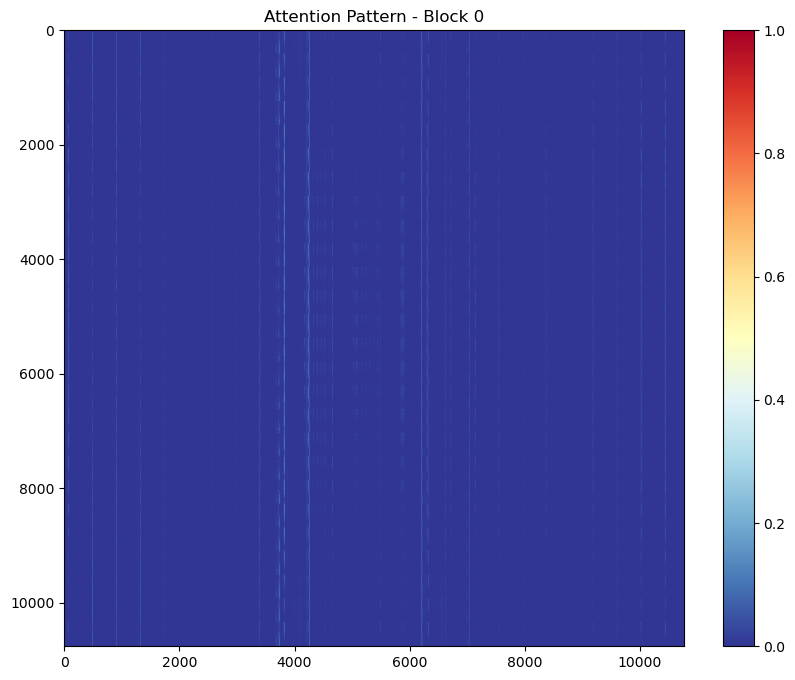

Mean attention: 0.000
Max attention: 0.852
Min attention: 0.000
Sparsity: 0.996

=== Analysis for Block 1 ===


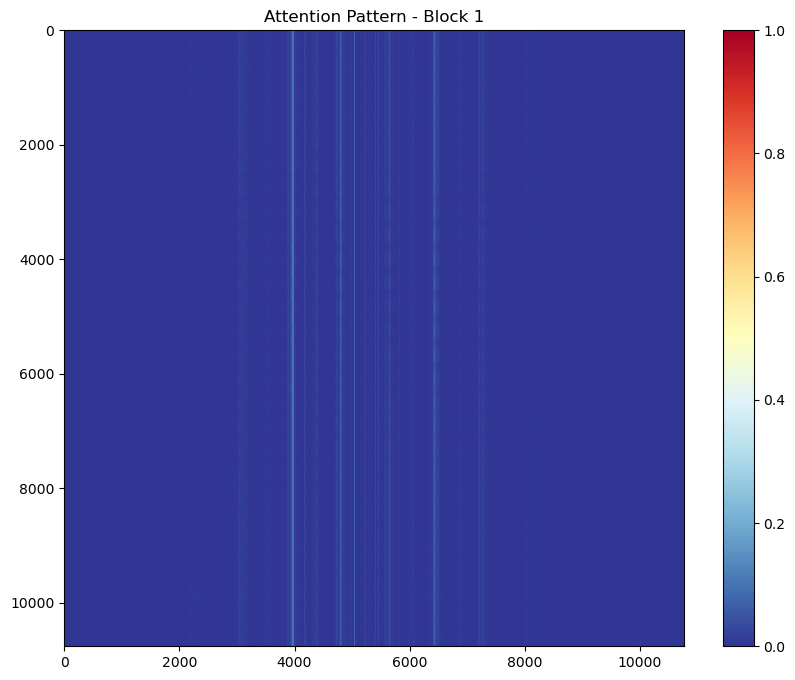

Mean attention: 0.000
Max attention: 0.898
Min attention: 0.000
Sparsity: 0.997

=== Analysis for Block 2 ===


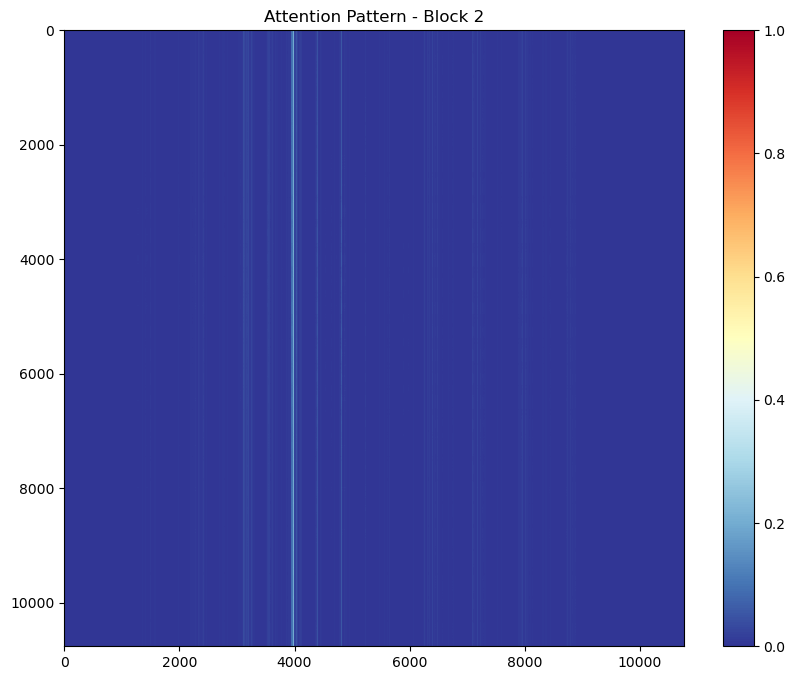

Mean attention: 0.000
Max attention: 0.984
Min attention: 0.000
Sparsity: 0.997

=== Analysis for Block 3 ===


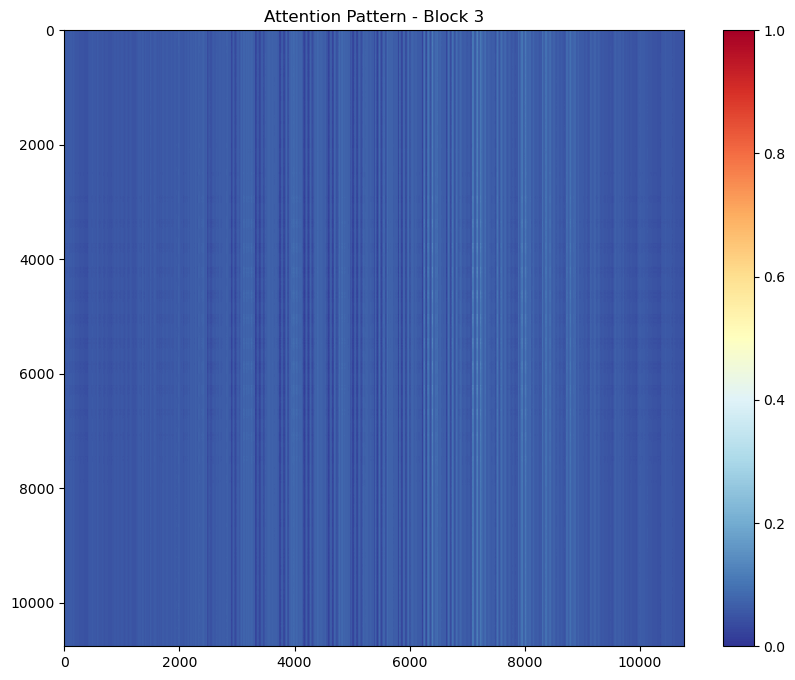

Mean attention: 0.000
Max attention: 0.089
Min attention: 0.000
Sparsity: 1.000

=== Analysis for Block 4 ===


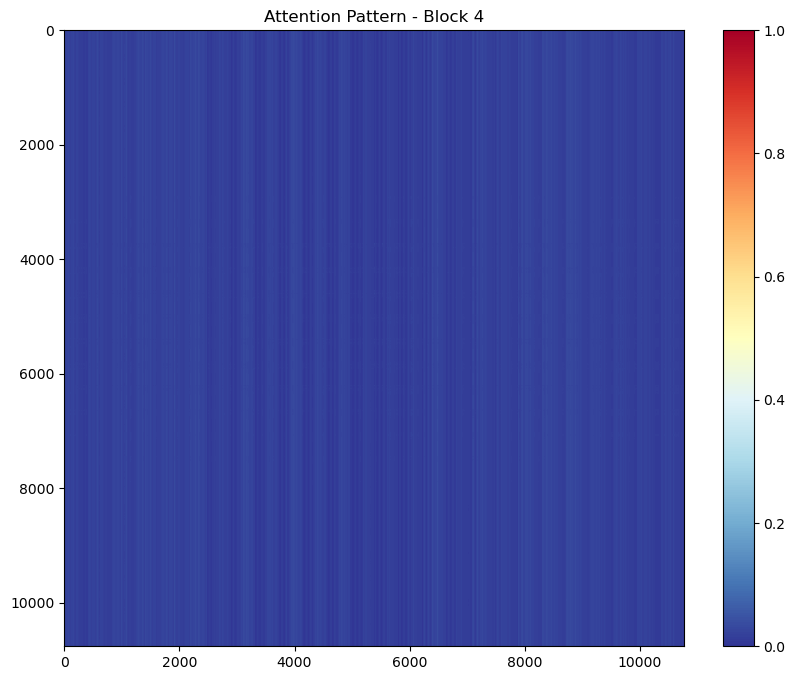

Mean attention: 0.000
Max attention: 0.894
Min attention: 0.000
Sparsity: 1.000


In [10]:
import gc
def plot_efficient_heatmap(attention_tensor, block_idx, save_path=None, figsize=(10, 8), dpi=100):
    """
    Memory-efficient heatmap plotting with enhanced visibility
    
    Args:
        attention_tensor: Single attention tensor
        block_idx: Index of transformer block
        save_path: Optional path to save figure
        figsize: Figure size
        dpi: DPI for figure resolution
    """
    # 1. Sum attention across batch and heads efficiently
    with torch.no_grad():
        sum_attention = attention_tensor.sum(dim=(0, 1)).cpu().numpy()
        
        # Enhance contrast by normalizing and applying power transformation
        sum_attention = (sum_attention - sum_attention.min()) / (sum_attention.max() - sum_attention.min())
        sum_attention = np.power(sum_attention, 0.5)  # Square root to enhance low values
        
    # 2. Clear any existing figures
    plt.close('all')
    
    # 3. Create figure with specific size and DPI
    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # 4. Use imshow with enhanced visibility settings
    # Create a brighter colormap by modifying 'hot'
    bright_cmap = plt.cm.RdYlBu_r  # Using reverse RdYlBu for better contrast
    plt.imshow(sum_attention, cmap=bright_cmap, aspect='auto', vmin=0, vmax=1)
    plt.colorbar()
    plt.title(f'Attention Pattern - Block {block_idx}')
    
    # Add grid for better pattern visibility
    #plt.grid(True, color='white', alpha=0.2, linestyle='-', linewidth=0.5)
    
    # 5. Save if path provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=dpi, facecolor='white')
        plt.close()
    else:
        plt.show()
    
    # 6. Clear memory
    plt.close()
    del sum_attention
    gc.collect()

def analyze_attention_patterns_memory_efficient(attention_maps, save_dir=None):
    """
    Memory-efficient attention pattern analysis
    """
    import gc
    
    for block_idx, attn in enumerate(attention_maps):
        print(f"\n=== Analysis for Block {block_idx} ===")
        
        # Process one attention map at a time
        with torch.no_grad():
            sum_attention = attn.sum(dim=(0, 1))
            
            # Basic statistics
            stats = {
                'mean': sum_attention.mean().item(),
                'max': sum_attention.max().item(),
                'min': sum_attention.min().item(),
                'sparsity': (sum_attention < 0.01).float().mean().item()
            }
            
            # Plot heatmap
            if save_dir:
                save_path = f"{save_dir}/attention_block_{block_idx}.png"
            else:
                save_path = None
                
            plot_efficient_heatmap(attn, block_idx, save_path)
            
            # Print statistics
            print(f"Mean attention: {stats['mean']:.3f}")
            print(f"Max attention: {stats['max']:.3f}")
            print(f"Min attention: {stats['min']:.3f}")
            print(f"Sparsity: {stats['sparsity']:.3f}")
            
            # Clear memory
            del sum_attention
            gc.collect()

def batch_process_attention_maps(attention_maps, batch_size=2):
    """
    Process attention maps in batches to reduce memory usage
    """
    num_blocks = len(attention_maps)
    
    for i in range(0, num_blocks, batch_size):
        batch_maps = attention_maps[i:min(i + batch_size, num_blocks)]
        
        print(f"\nProcessing blocks {i} to {min(i + batch_size - 1, num_blocks-1)}")
        analyze_attention_patterns_memory_efficient(batch_maps)
        
        # Force garbage collection
        gc.collect()

# Usage example:
def analyze_model_attention_efficient(analyzer, input_tensor, save_dir=None):
    """Memory-efficient attention analysis workflow"""
    import os
    import gc
    
    # Create save directory if needed
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
    
    # Get attention maps
    attention_maps = analyzer.analyze_attention_patterns(input_tensor)
    
    # Process in batches
    analyze_attention_patterns_memory_efficient(attention_maps)
    
    # Clear memory
    gc.collect()
    
    return attention_maps

# Run the analysis
save_dir = "attention_plots"  # Optional: specify directory to save plots
attention_maps = analyze_model_attention_efficient(analyzer, low, save_dir)

In [11]:
def position_to_hkl(position, h2ind, k2ind, l2ind):
    """
    Convert flattened position back to HKL indices
    
    Args:
        position: Flattened position index
        h2ind, k2ind, l2ind: Index mapping dictionaries
    Returns:
        (h,k,l) tuple of actual HKL values
    """
    # Get dimensions
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    # Convert tensor to integer if needed
    if torch.is_tensor(position):
        position = position.item()
    
    # Reverse the index mappings
    ind2h = {v: k for k, v in h2ind.items()}
    ind2k = {v: k for k, v in k2ind.items()}
    ind2l = {v: k for k, v in l2ind.items()}
    
    # Convert position to indices
    # The order matches the transformer's flattening:
    # position = h * (K * L) + k * L + l
    h_idx = position // (K * L)
    k_idx = (position % (K * L)) // L
    l_idx = position % L

    # Ensure indices are within bounds
    if h_idx >= H or k_idx >= K or l_idx >= L:
        raise ValueError(f"Position {position} is out of bounds for grid size {H}x{K}x{L}")
    
    # Convert indices to actual HKL values
    h = ind2h[h_idx]
    k = ind2k[k_idx]
    l = ind2l[l_idx]
    
    return h, k, l


=== Attention Block 0 ===


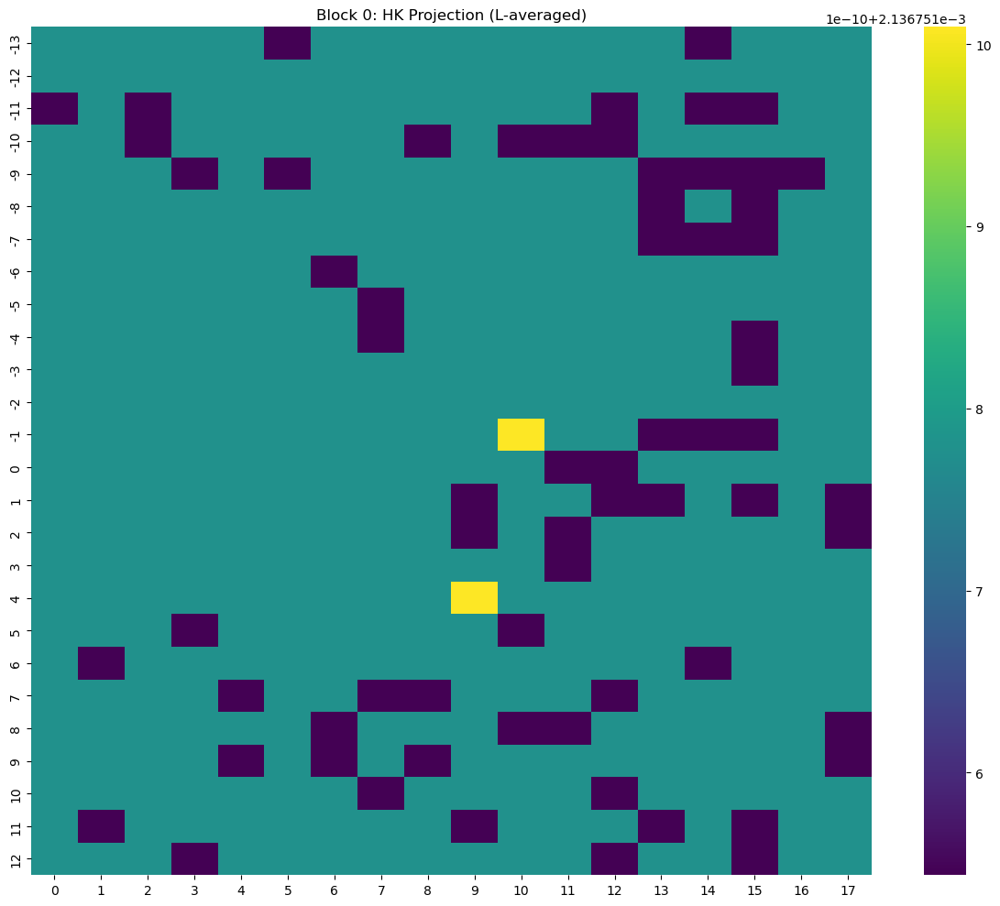

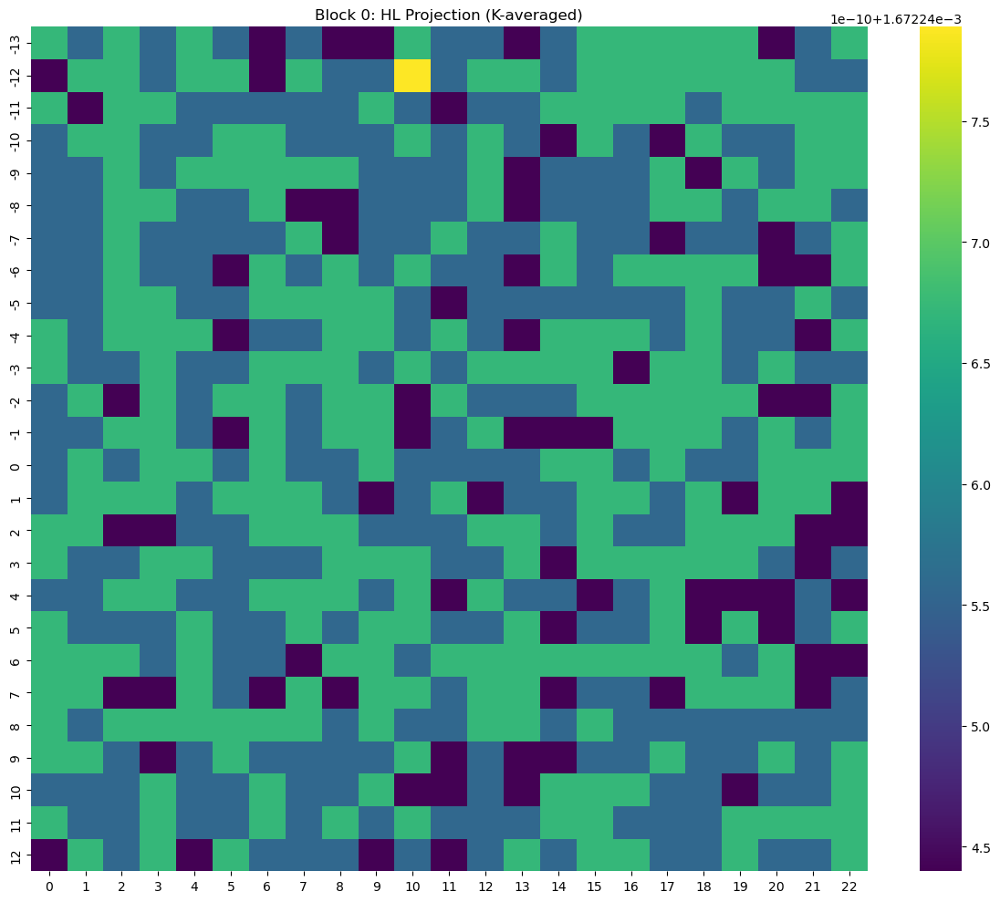

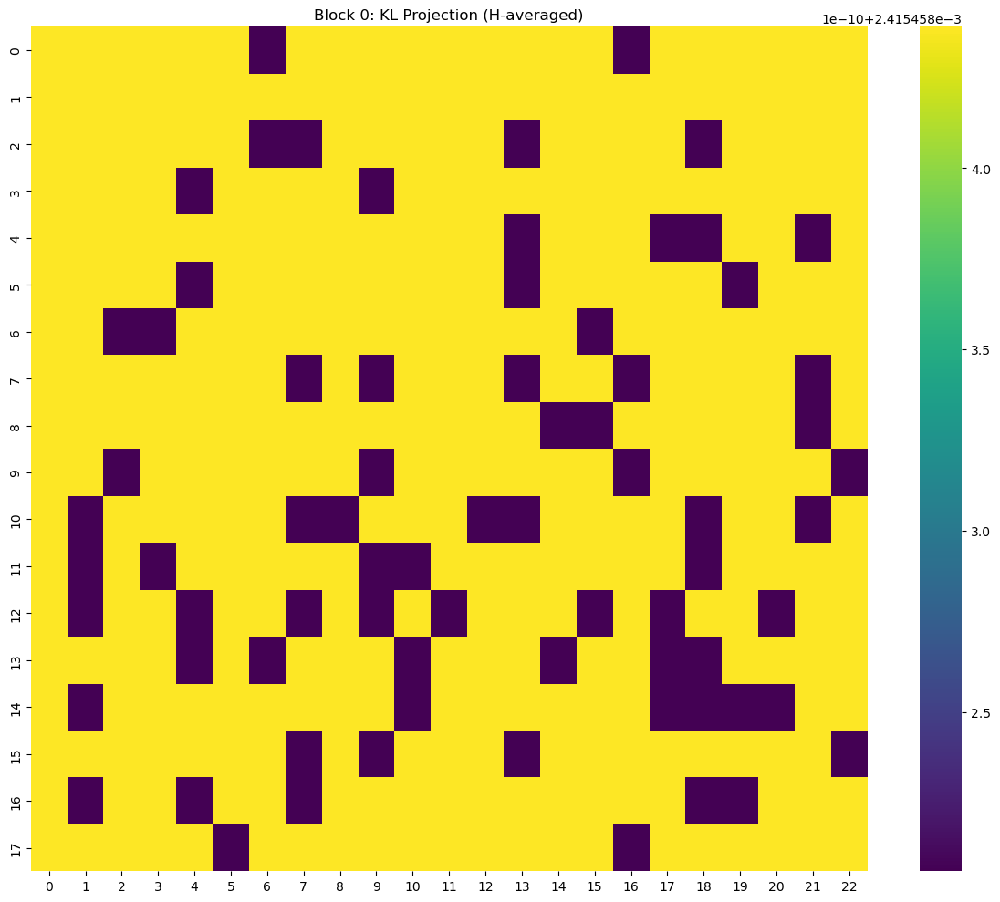

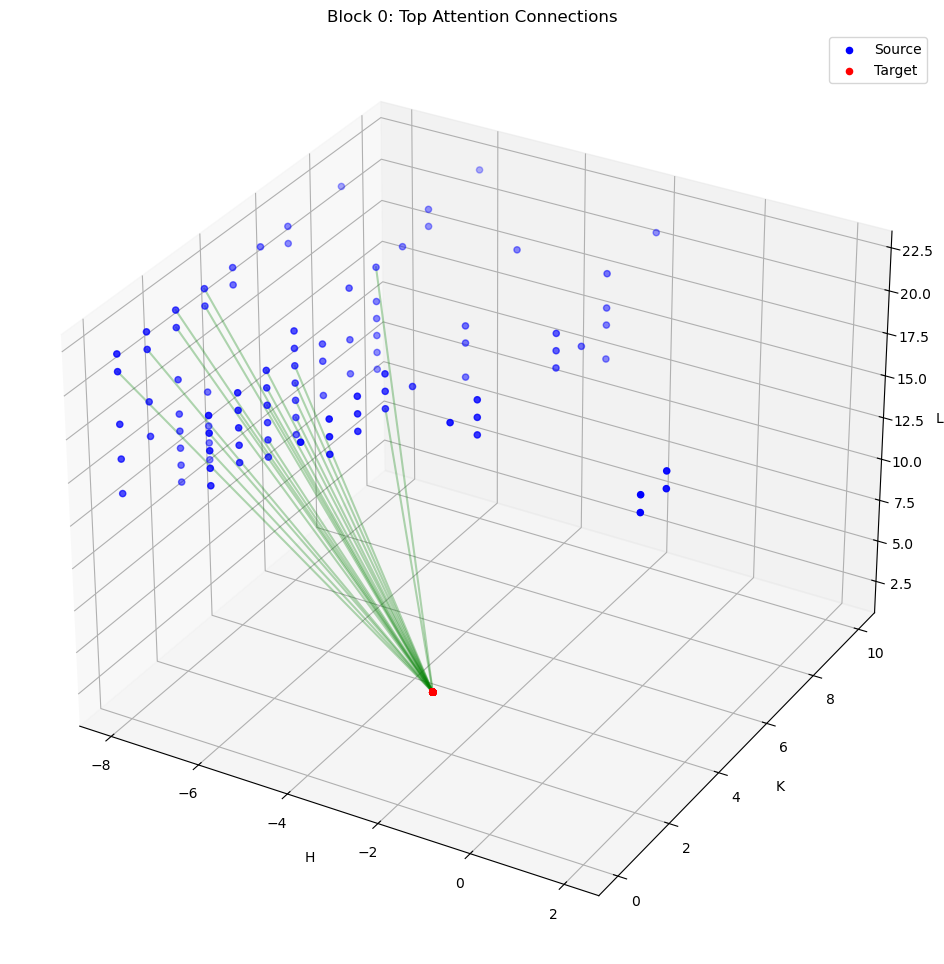


=== Attention Block 1 ===


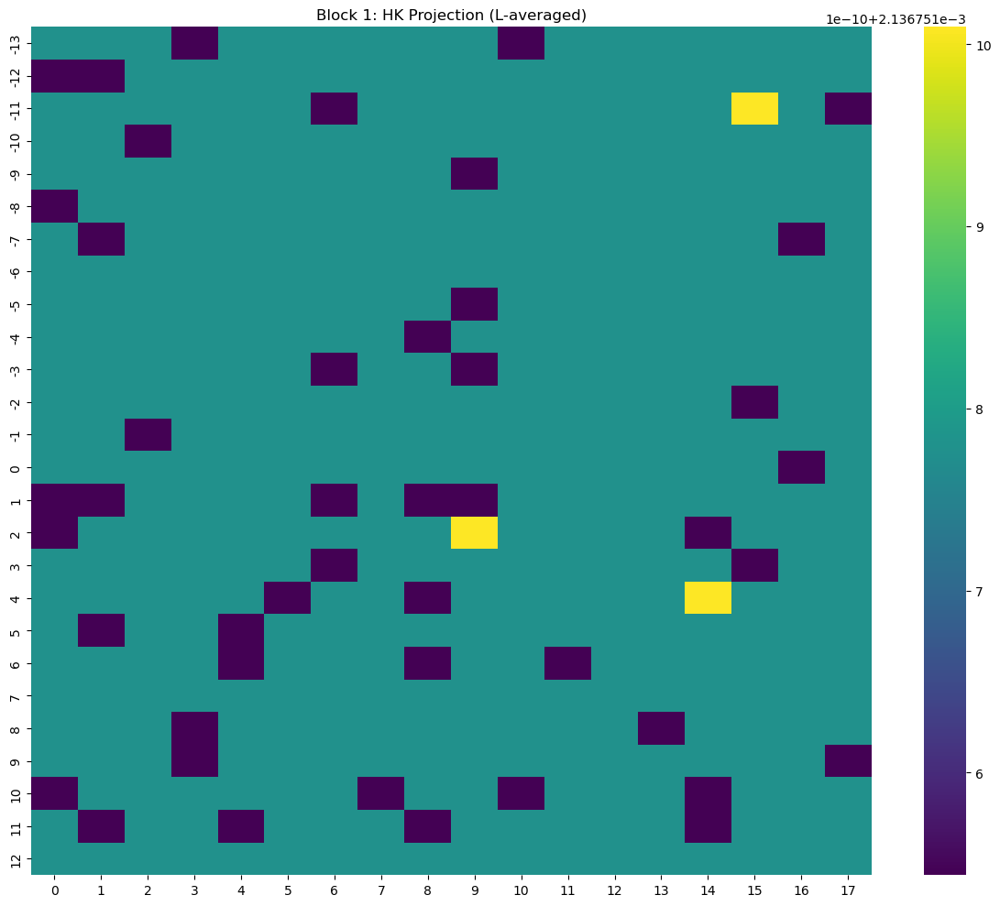

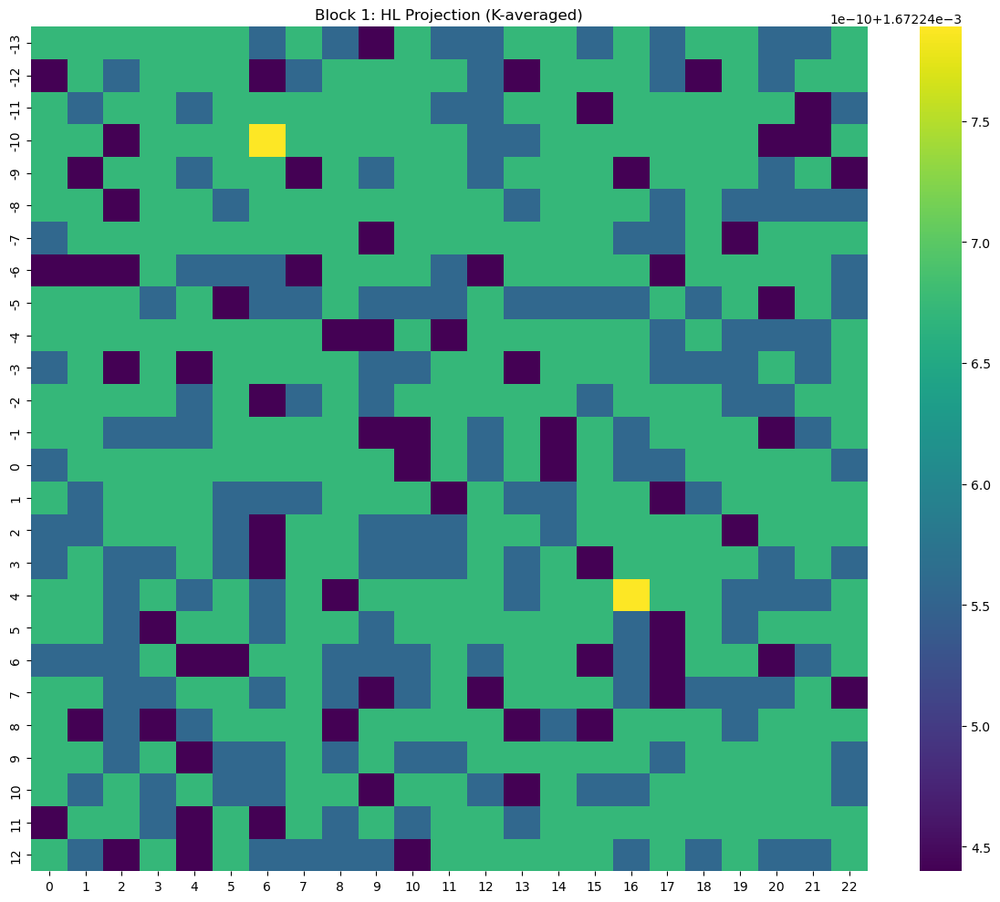

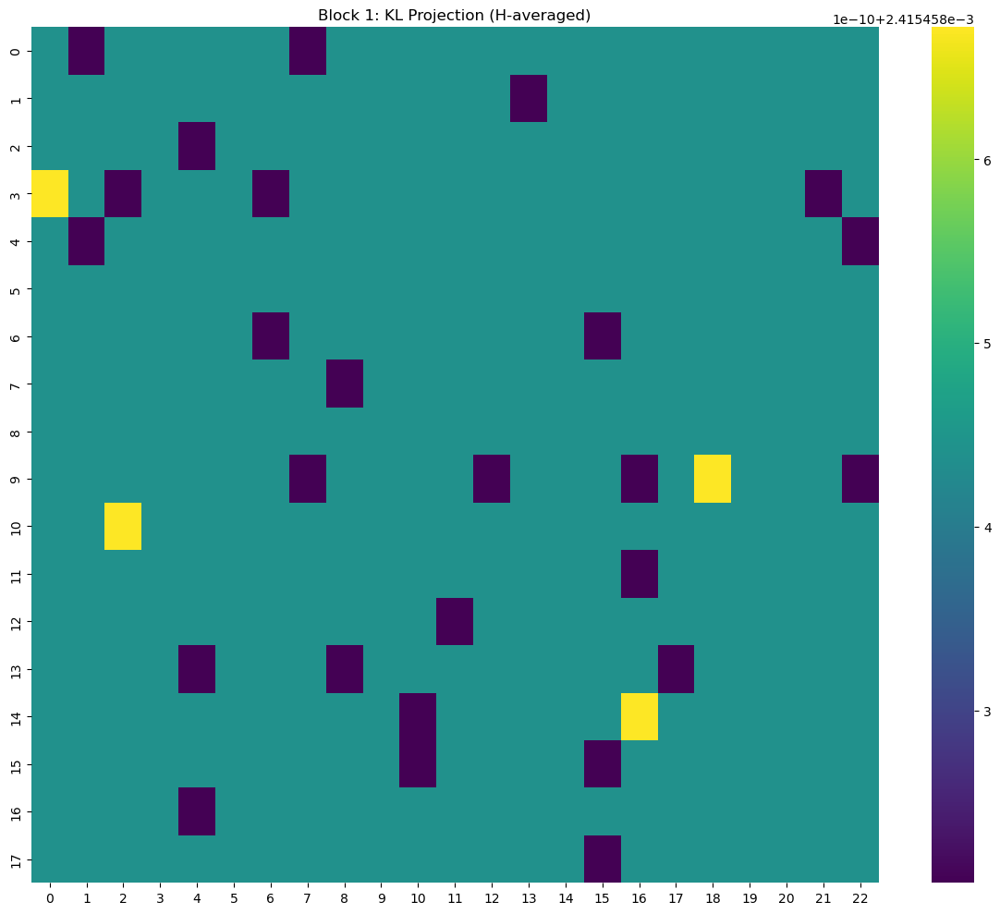

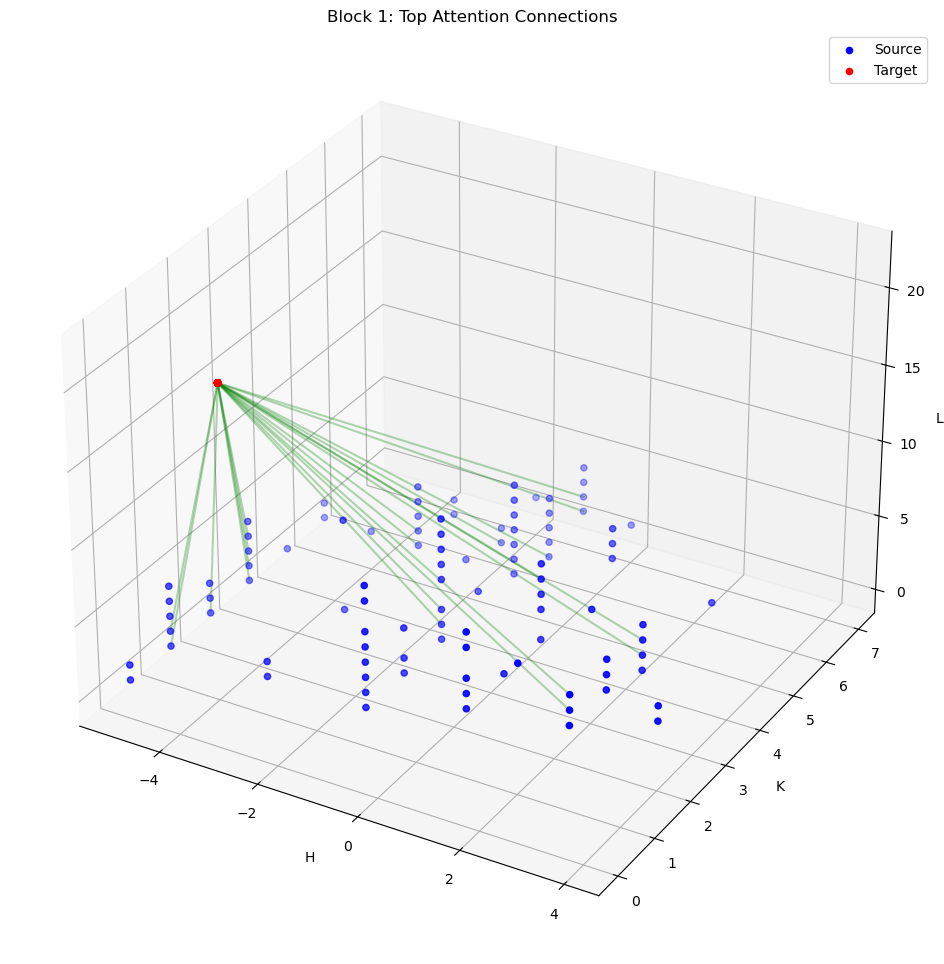


=== Attention Block 2 ===


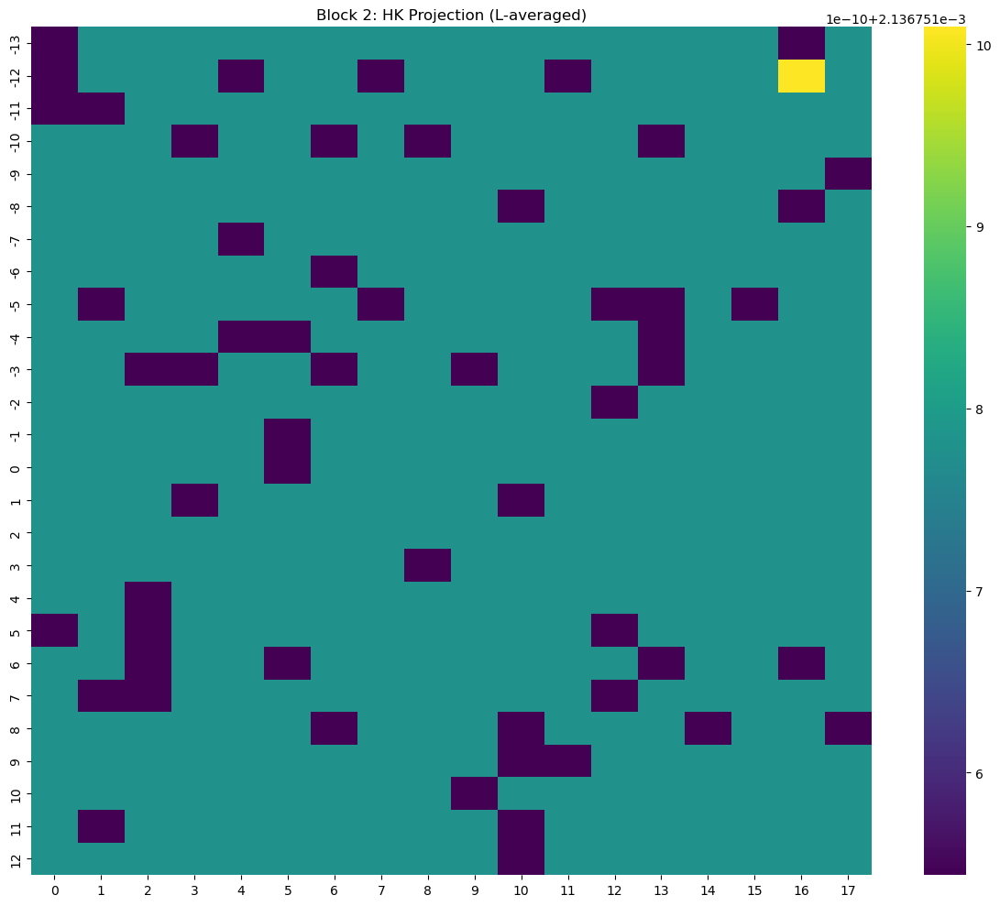

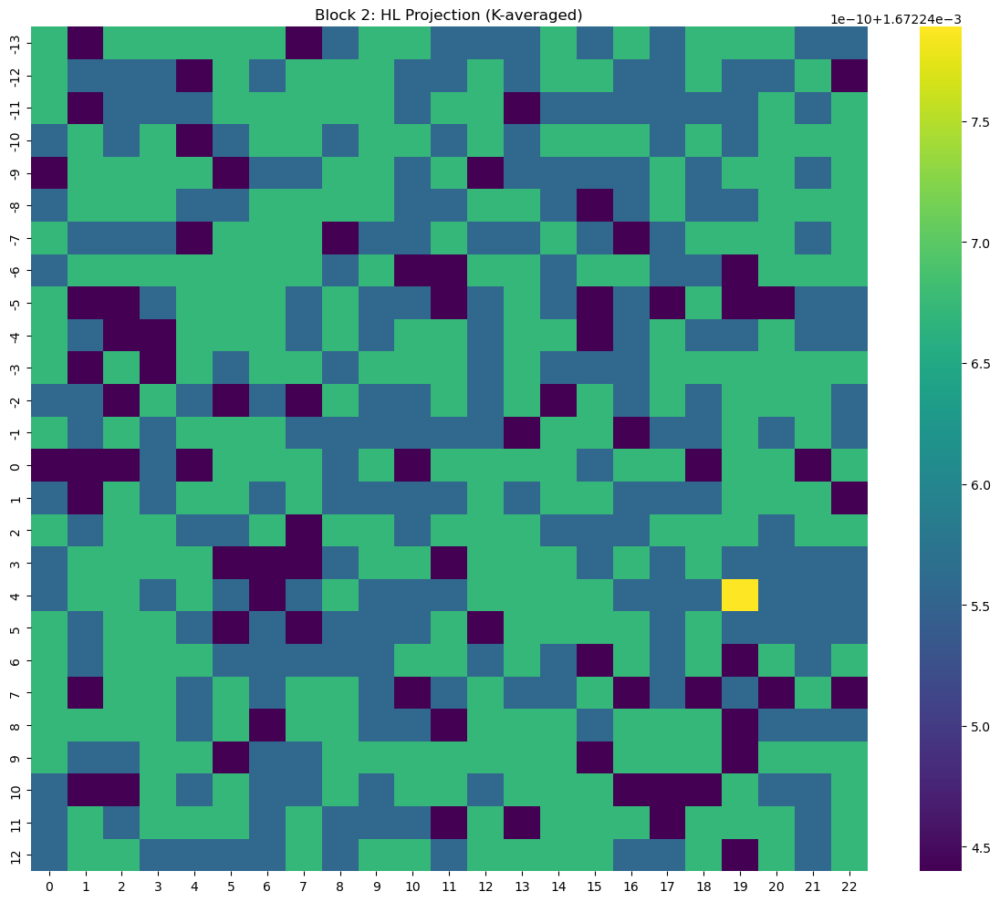

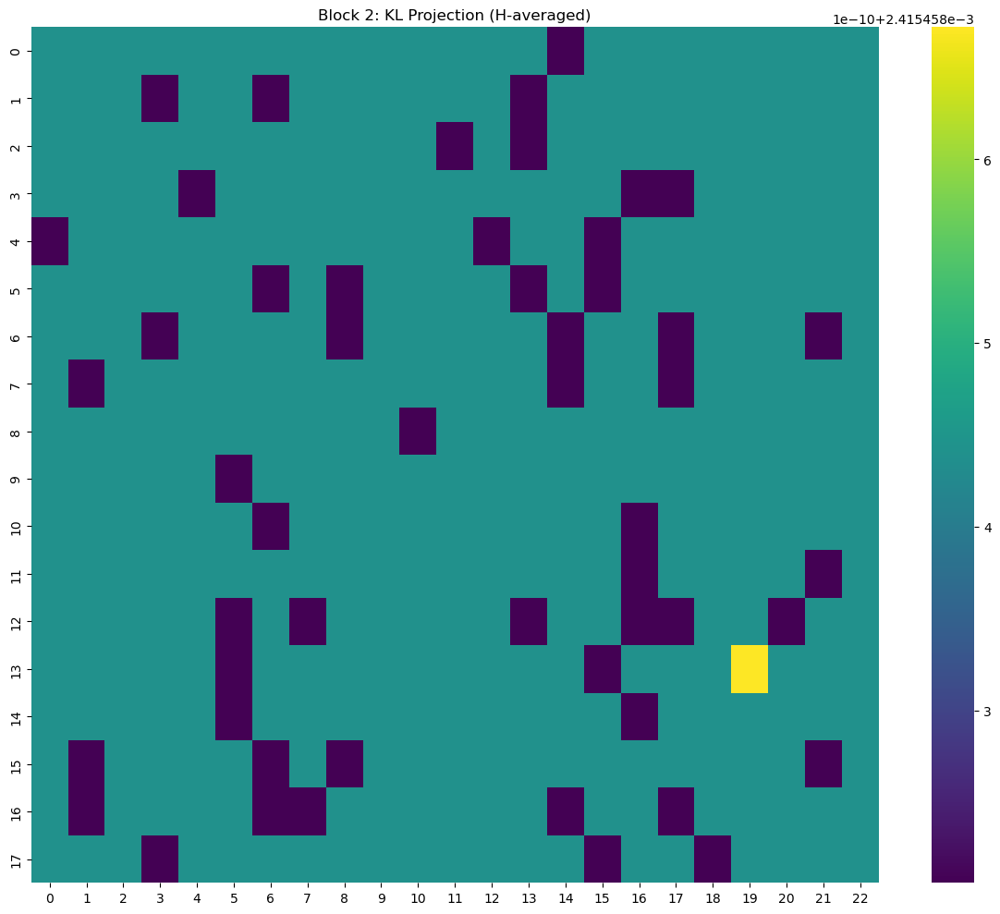

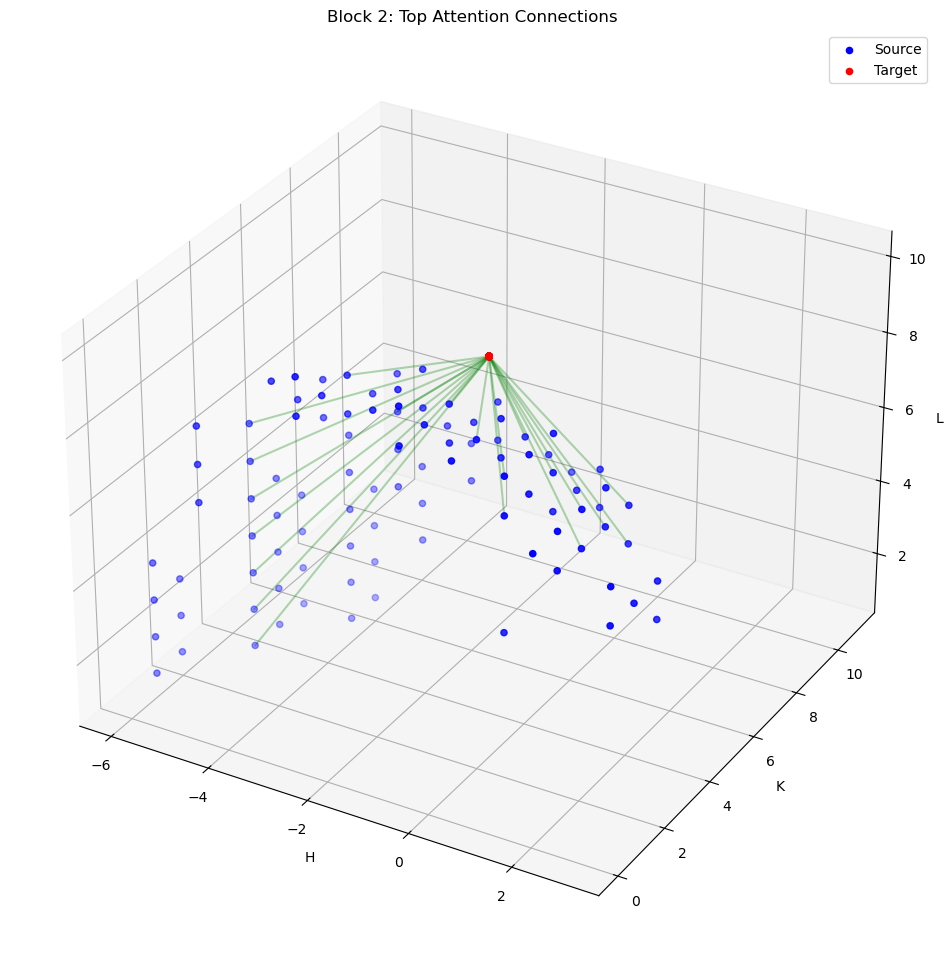


=== Attention Block 3 ===


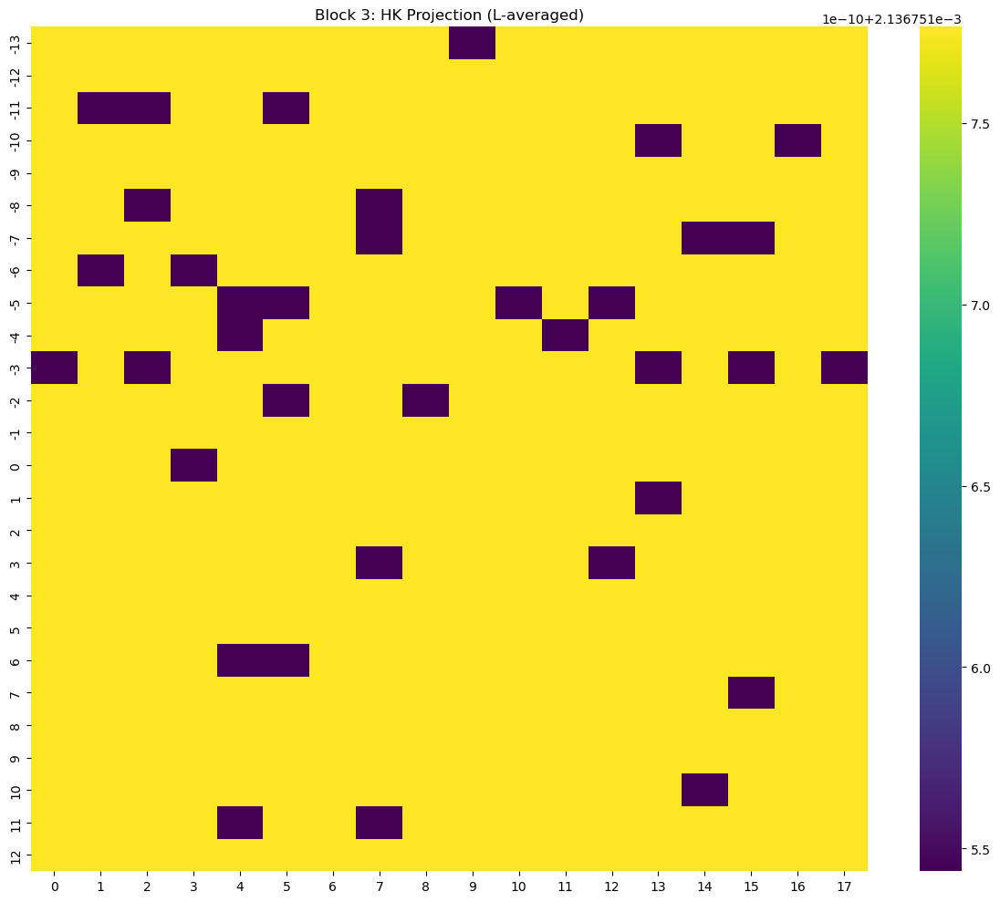

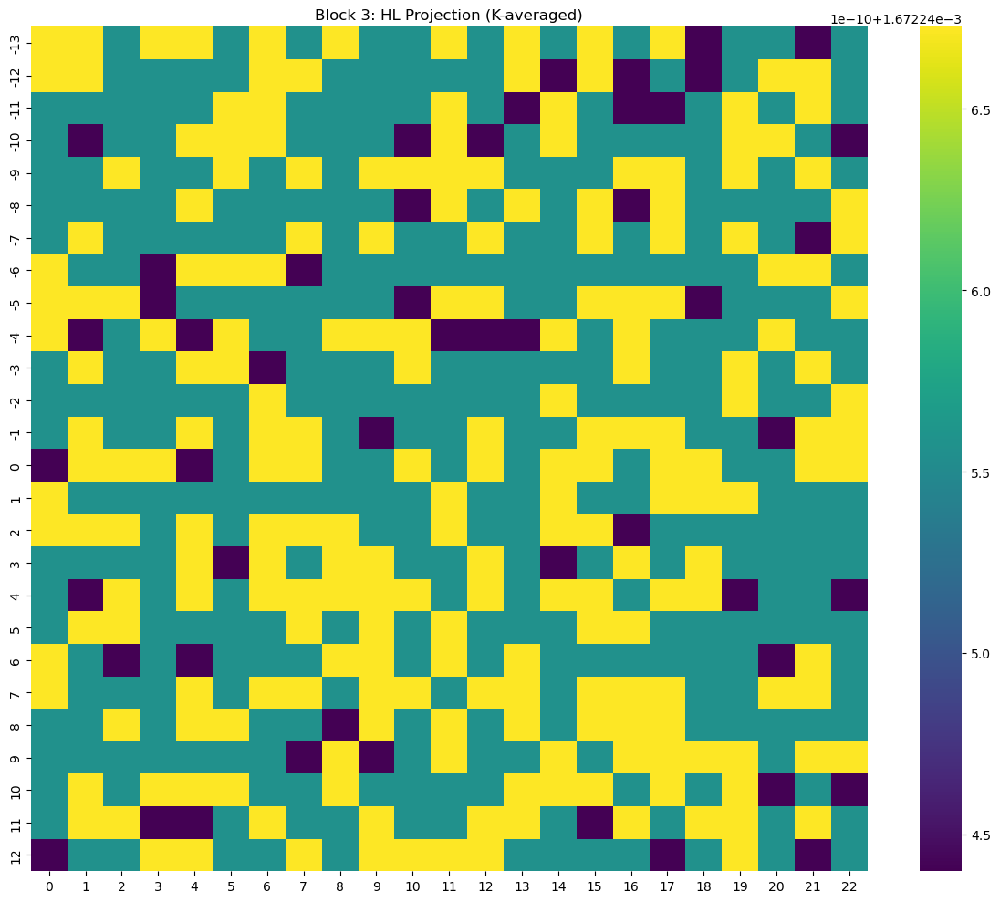

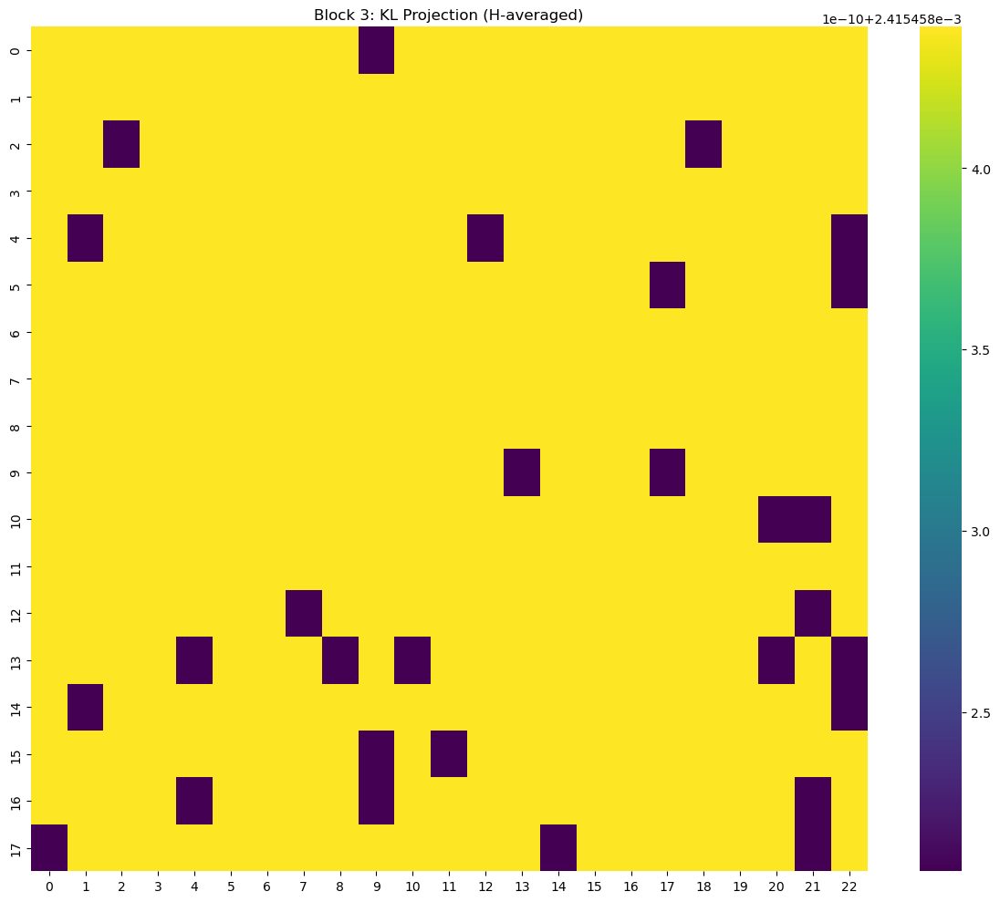

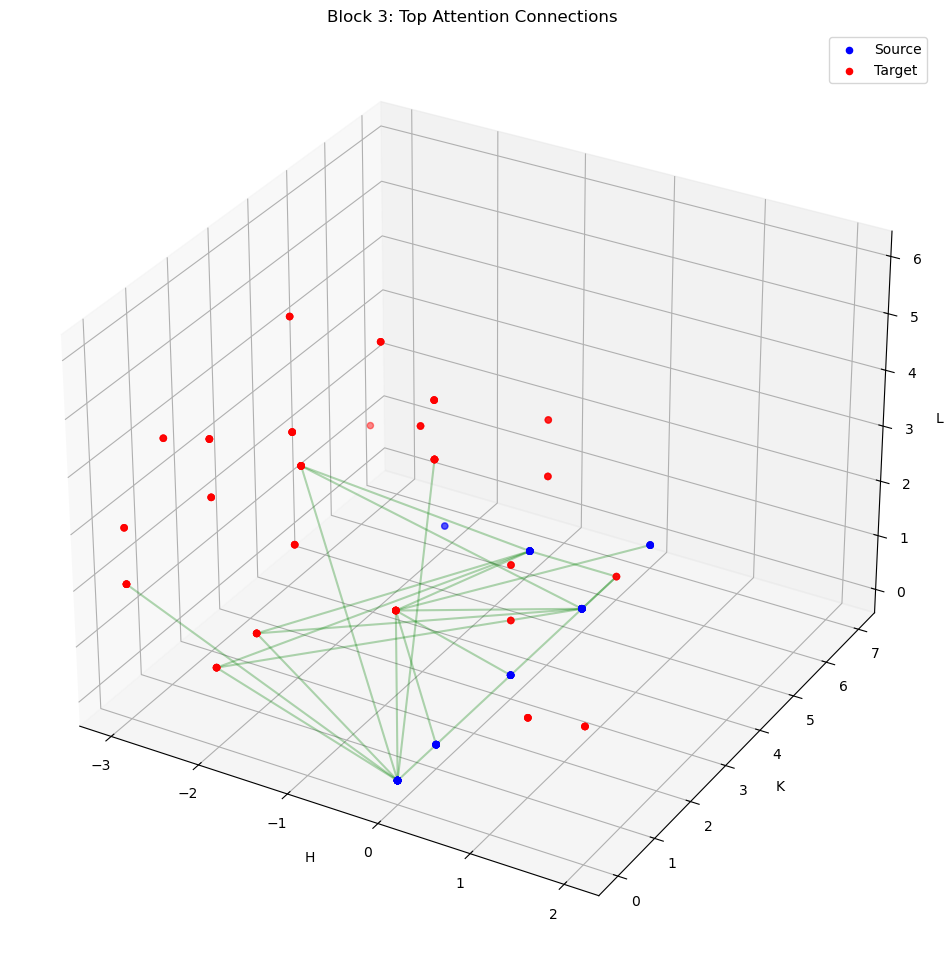


=== Attention Block 4 ===


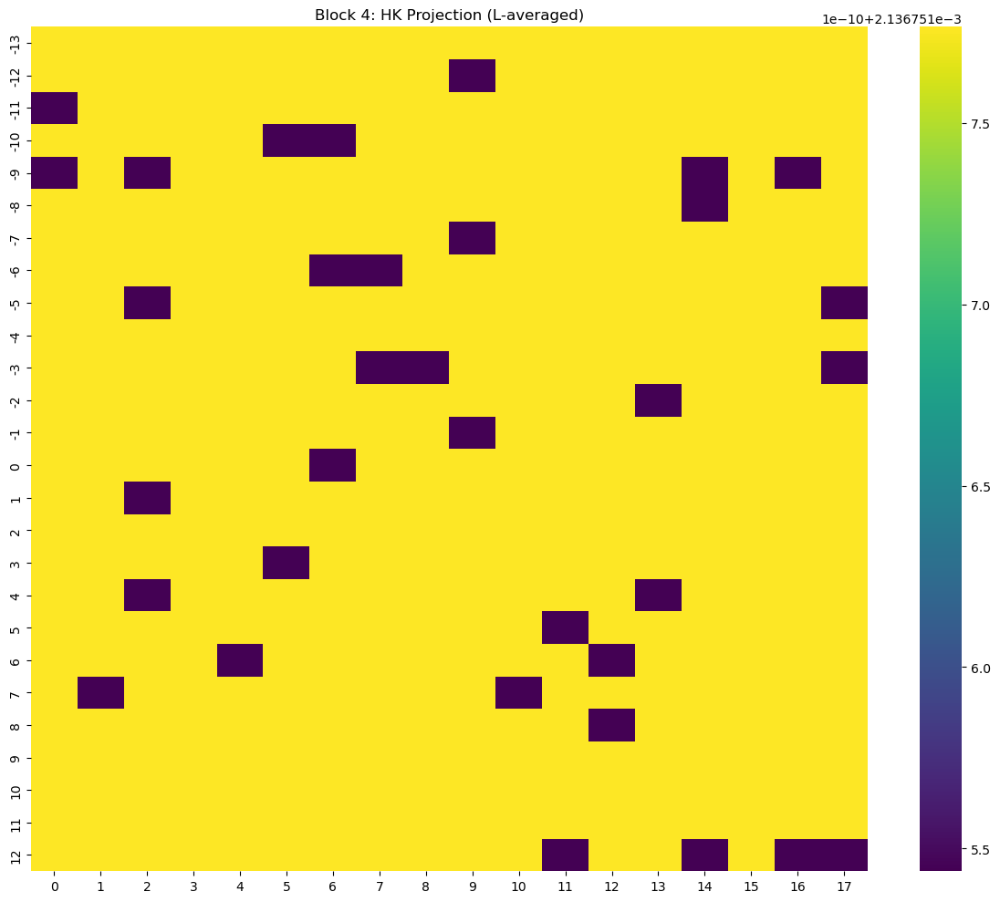

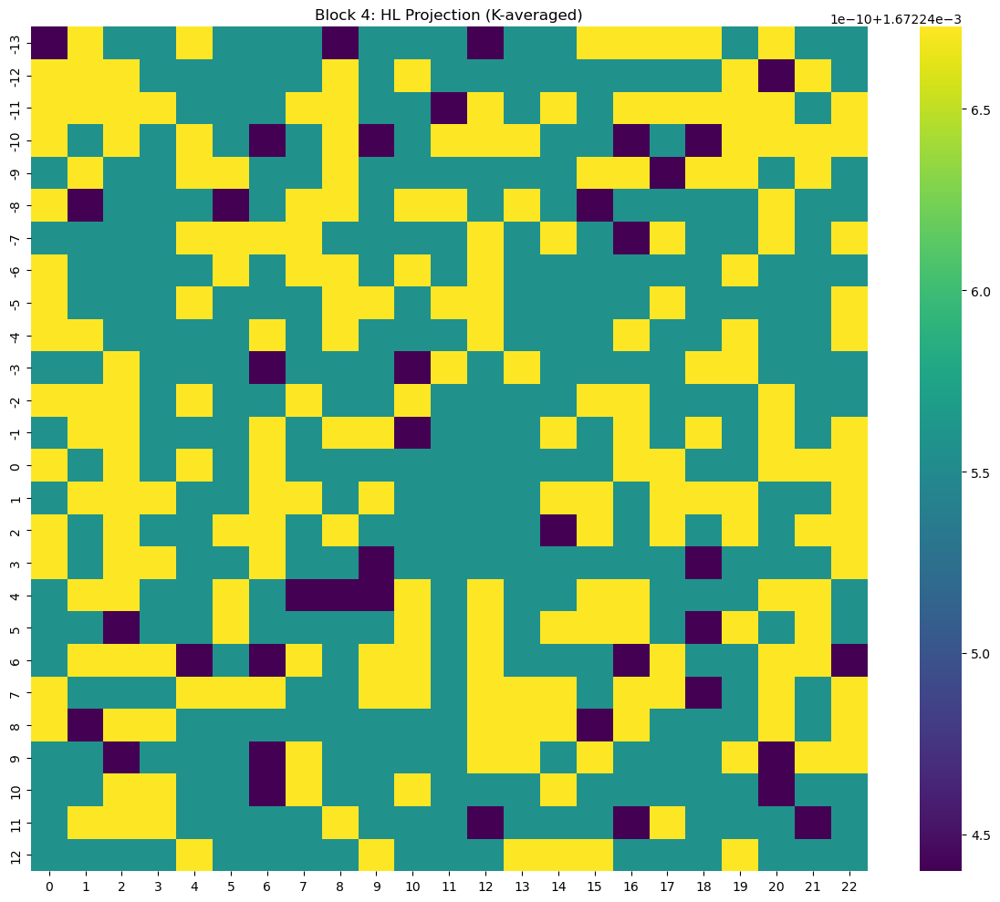

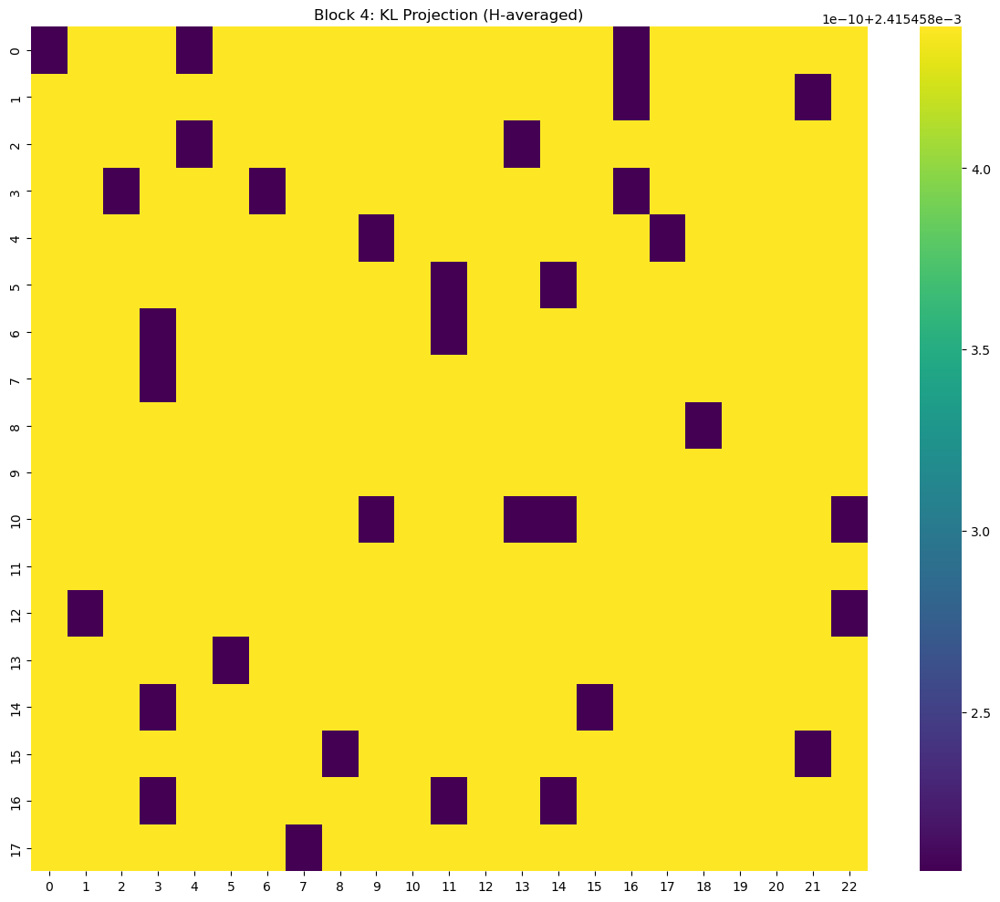

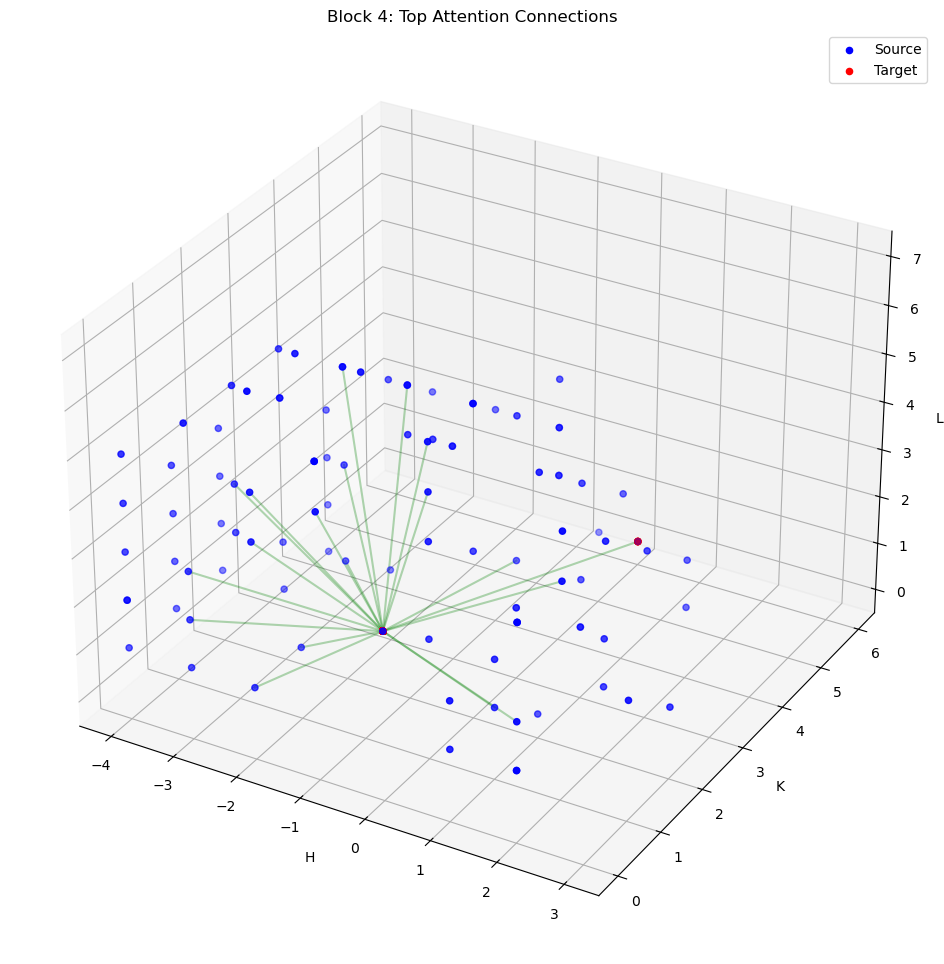

In [12]:



def create_attention_visualizations(attention_maps, h2ind, k2ind, l2ind):
    """
    Create multiple views of attention patterns in HKL space
    
    Args:
        attention_maps: List of attention tensors
        h2ind, k2ind, l2ind: Index mapping dictionaries
    """
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    
    def plot_hkl_slice(attention_slice, title, axis_labels):
        plt.figure(figsize=(12, 10))
        sns.heatmap(attention_slice, cmap='viridis', 
                   xticklabels=axis_labels[1], 
                   yticklabels=axis_labels[0])
        plt.title(title)
        plt.tight_layout()
        plt.show()
    
    for block_idx, attn in enumerate(attention_maps):
        print(f"\n=== Attention Block {block_idx} ===")
        
        # Average attention over batch and heads
        avg_attn = attn.mean(dim=(0, 1)).cpu()  # Shape: [seq_len, seq_len]
        
        # 1. Create HK projection (summing over L)
        hk_attention = torch.zeros((H, K))
        for h in range(H):
            for k in range(K):
                h_start = h * (K * L)
                k_start = k * L
                for l in range(L):
                    pos = h_start + k_start + l
                    hk_attention[h, k] += avg_attn[pos].mean()
        
        # 2. Create HL projection (summing over K)
        hl_attention = torch.zeros((H, L))
        for h in range(H):
            for l in range(L):
                h_start = h * (K * L)
                sum_attention = 0
                for k in range(K):
                    pos = h_start + k * L + l
                    hl_attention[h, l] += avg_attn[pos].mean()
        
        # 3. Create KL projection (summing over H)
        kl_attention = torch.zeros((K, L))
        for k in range(K):
            for l in range(L):
                sum_attention = 0
                for h in range(H):
                    pos = h * (K * L) + k * L + l
                    kl_attention[k, l] += avg_attn[pos].mean()
        
        # Create axis labels
        h_labels = [str(k) for k in sorted(h2ind.keys())]
        k_labels = [str(k) for k in sorted(k2ind.keys())]
        l_labels = [str(k) for k in sorted(l2ind.keys())]
        
        # Plot projections
        plot_hkl_slice(hk_attention.numpy(), 
                      f'Block {block_idx}: HK Projection (L-averaged)',
                      (h_labels, k_labels))
        
        plot_hkl_slice(hl_attention.numpy(), 
                      f'Block {block_idx}: HL Projection (K-averaged)',
                      (h_labels, l_labels))
        
        plot_hkl_slice(kl_attention.numpy(), 
                      f'Block {block_idx}: KL Projection (H-averaged)',
                      (k_labels, l_labels))
        
        # 4. Optional: Create 3D visualization for strong connections
        values, indices = torch.topk(avg_attn.view(-1), 100)
        rows = indices // (H * K * L)
        cols = indices % (H * K * L)
        
        # Convert to HKL coordinates
        source_points = []
        target_points = []
        for i in range(100):
            h1, k1, l1 = position_to_hkl(rows[i], h2ind, k2ind, l2ind)
            h2, k2, l2 = position_to_hkl(cols[i], h2ind, k2ind, l2ind)
            source_points.append([h1, k1, l1])
            target_points.append([h2, k2, l2])
        
        # Plot 3D connections (requires mplot3d)
        fig = plt.figure(figsize=(12, 12))
        ax = fig.add_subplot(111, projection='3d')
        source_points = np.array(source_points)
        target_points = np.array(target_points)
        
        # Plot points and connections
        ax.scatter(source_points[:, 0], source_points[:, 1], source_points[:, 2], 
                  c='blue', label='Source')
        ax.scatter(target_points[:, 0], target_points[:, 1], target_points[:, 2], 
                  c='red', label='Target')
        
        # Plot top 20 strongest connections
        for i in range(20):
            ax.plot([source_points[i, 0], target_points[i, 0]],
                   [source_points[i, 1], target_points[i, 1]],
                   [source_points[i, 2], target_points[i, 2]], 'g-', alpha=0.3)
        
        ax.set_xlabel('H')
        ax.set_ylabel('K')
        ax.set_zlabel('L')
        ax.legend()
        plt.title(f'Block {block_idx}: Top Attention Connections')
        plt.show()

# Usage
attention_maps = analyzer.analyze_attention_patterns(low)
create_attention_visualizations(attention_maps, h2ind, k2ind, l2ind)

Plotting 300 connections...


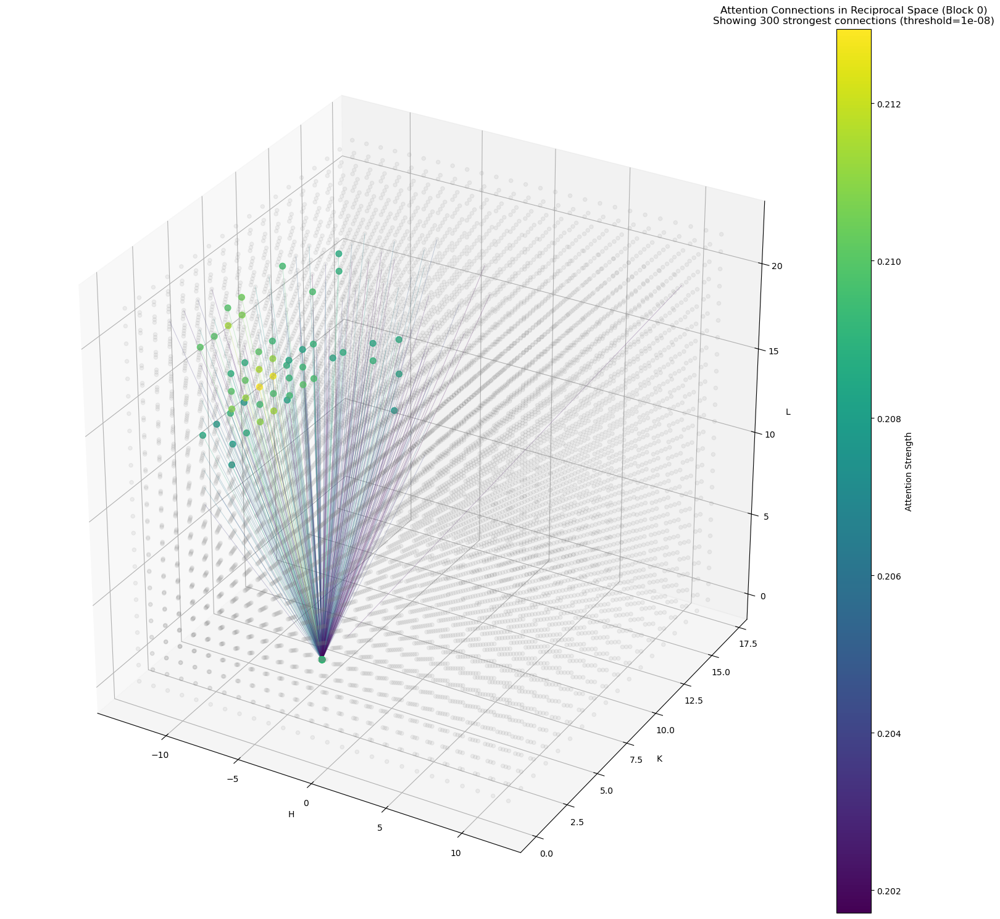


Attention Statistics:
Mean attention value: 0.2053
Max attention value: 0.2129
Min attention value: 0.2017
Plotting 300 connections...


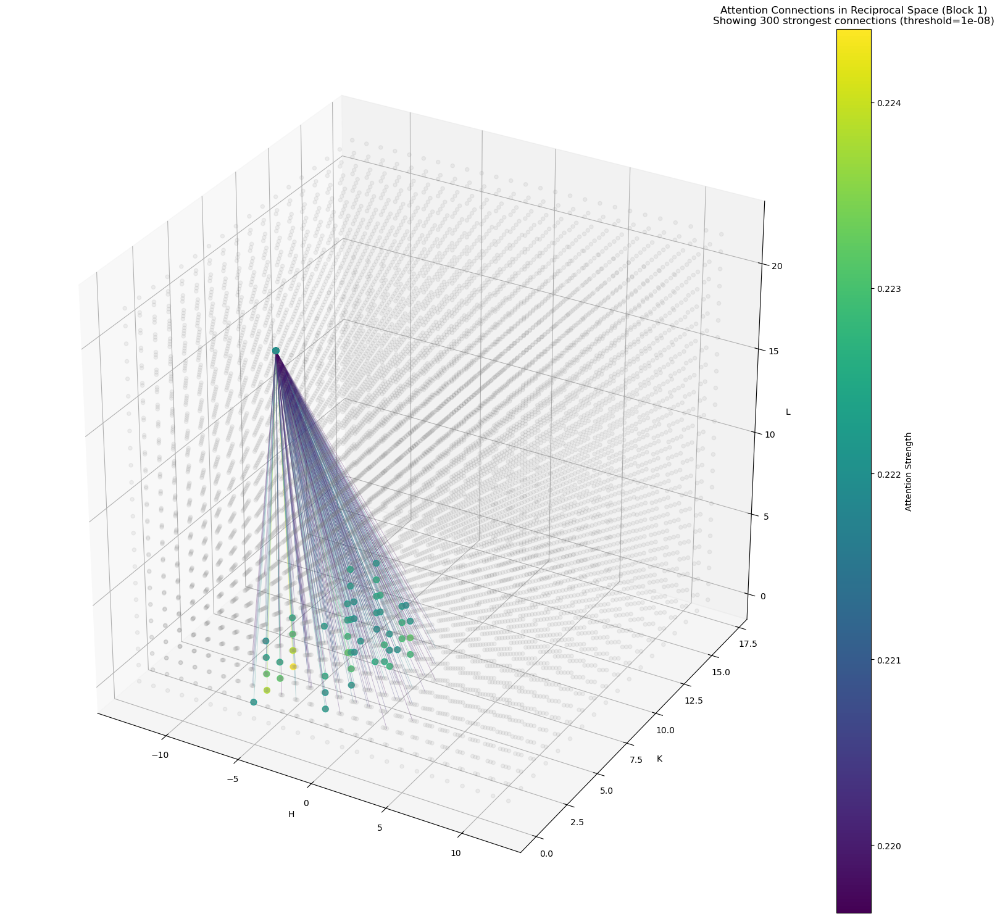


Attention Statistics:
Mean attention value: 0.2210
Max attention value: 0.2244
Min attention value: 0.2196
Plotting 300 connections...


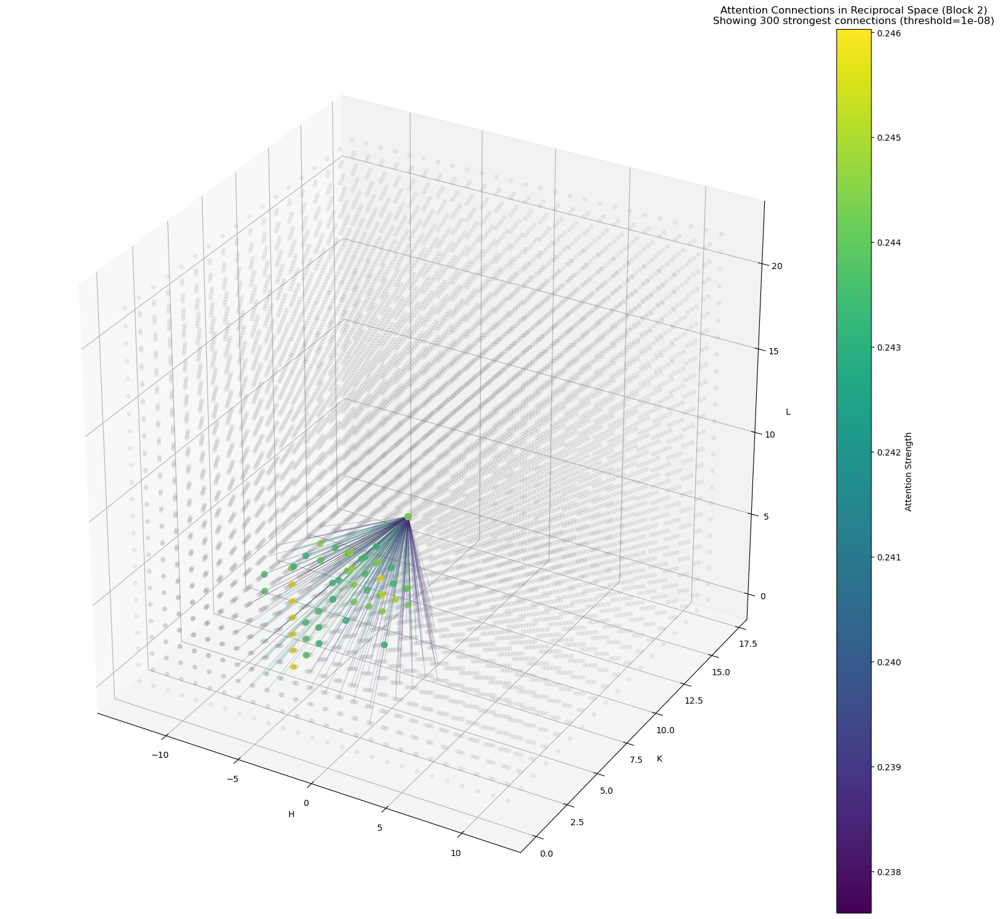


Attention Statistics:
Mean attention value: 0.2409
Max attention value: 0.2460
Min attention value: 0.2376
Plotting 300 connections...


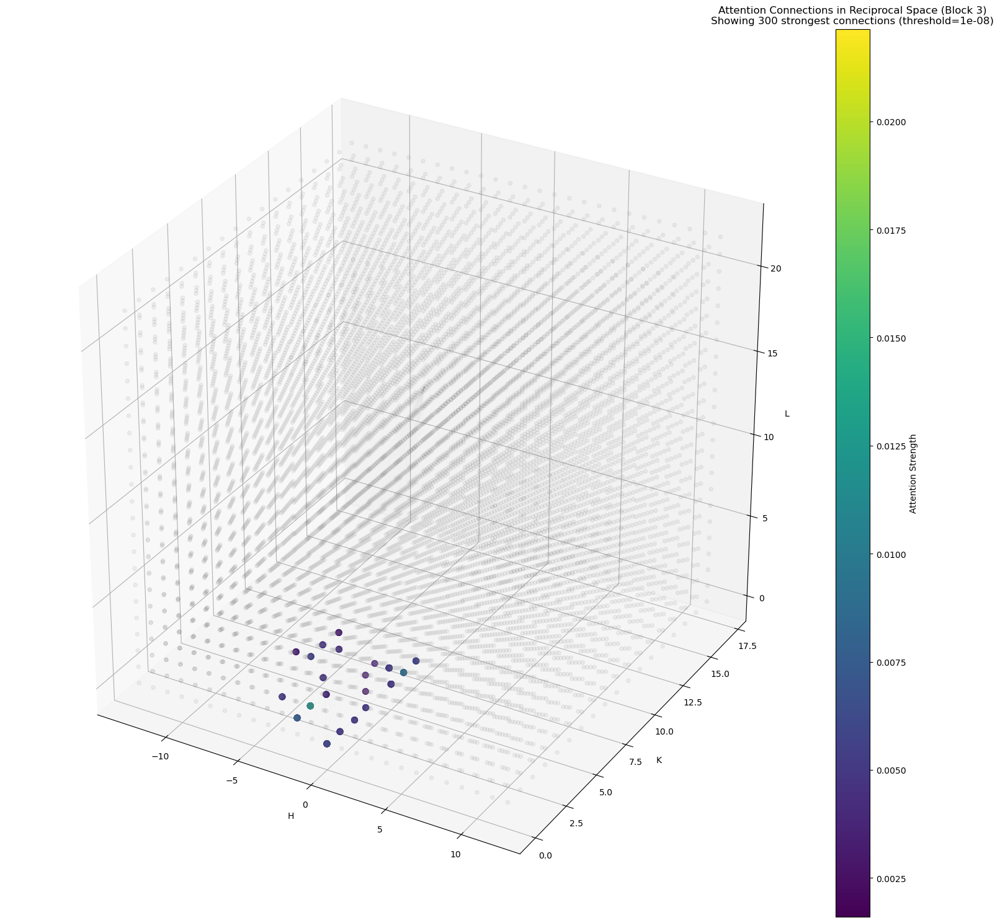


Attention Statistics:
Mean attention value: 0.0025
Max attention value: 0.0221
Min attention value: 0.0016
Plotting 300 connections...


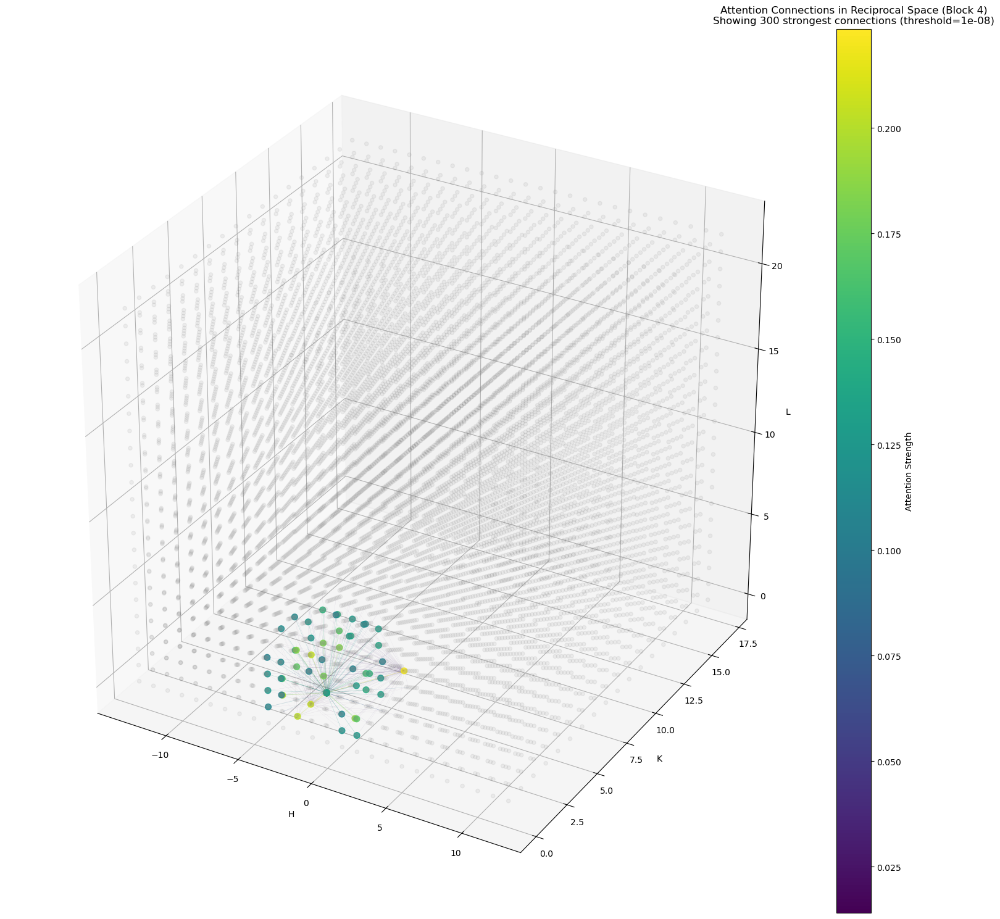


Attention Statistics:
Mean attention value: 0.0494
Max attention value: 0.2235
Min attention value: 0.0140


In [13]:
def plot_attention_connections_3d(attention_maps, h2ind, k2ind, l2ind, 
                                threshold=0.1,
                                max_connections=1000,
                                block_idx=0):
    # Setup 3D plot with proper sizing for colorbar
    fig = plt.figure(figsize=(15, 15))
    gs = fig.add_gridspec(1, 20)
    ax = fig.add_subplot(gs[0, :19], projection='3d')
    cax = fig.add_subplot(gs[0, 19])
    
    # Get average attention for specified block
    avg_attn = attention_maps[block_idx].mean(dim=(0, 1)).cpu()
    
    # Get dimensions
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    
    # Create all HKL points
    all_points = []
    for h in h2ind.keys():
        for k in k2ind.keys():
            for l in l2ind.keys():
                all_points.append([h, k, l])
    all_points = np.array(all_points)
    
    # Plot all HKL points
    ax.scatter(all_points[:, 0], all_points[:, 1], all_points[:, 2], 
              c='gray', alpha=0.1, s=20)
    
    # Get attention values above threshold
    values = avg_attn.flatten()
    mask = values > threshold
    
    if not mask.any():
        print(f"No attention values above threshold {threshold}.")
        print(f"Max attention value: {values.max():.4f}")
        print(f"Mean attention value: {values.mean():.4f}")
        print("Try lowering the threshold.")
        plt.close()
        return
        
    values = values[mask]
    indices = torch.arange(len(avg_attn.flatten()))[mask]
    
    # Sort by attention strength and limit number of connections
    sorted_indices = torch.argsort(values, descending=True)
    if len(sorted_indices) > max_connections:
        sorted_indices = sorted_indices[:max_connections]
    
    values = values[sorted_indices]
    indices = indices[sorted_indices]
    
    # Convert to source and target indices
    rows = indices // (H * K * L)
    cols = indices % (H * K * L)
    
    # Create colormap for attention strengths
    norm = plt.Normalize(values.min().item(), values.max().item())
    cmap = plt.cm.viridis
    
    # Plot connections
    print(f"Plotting {len(values)} connections...")
    for i in range(len(values)):
        h1, k1, l1 = position_to_hkl(rows[i], h2ind, k2ind, l2ind)
        h2, k2, l2 = position_to_hkl(cols[i], h2ind, k2ind, l2ind)
        
        color = cmap(norm(values[i].item()))
        line = ax.plot([h1, h2], [k1, k2], [l1, l2], '-', 
                      color=color, alpha=0.3, linewidth=values[i].item()*3)
        
        # Optional: add small spheres at endpoints for strongest connections
        if i < 50:
            ax.scatter([h1, h2], [k1, k2], [l1, l2], 
                      color=color, s=50, alpha=0.8)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, cax=cax, label='Attention Strength')
    
    # Set labels and title
    ax.set_xlabel('H')
    ax.set_ylabel('K')
    ax.set_zlabel('L')
    plt.title(f'Attention Connections in Reciprocal Space (Block {block_idx})\n'
              f'Showing {len(values)} strongest connections (threshold={threshold})')
    
    # Optional: Add grid
    ax.grid(True, alpha=0.3)
    
    # Set equal aspect ratio
    ax.set_box_aspect([1,1,1])
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\nAttention Statistics:")
    print(f"Mean attention value: {values.mean():.4f}")
    print(f"Max attention value: {values.max():.4f}")
    print(f"Min attention value: {values.min():.4f}")

# Usage with lower threshold
for block_idx in range(len(attention_maps)):
    plot_attention_connections_3d(
        attention_maps, 
        h2ind, 
        k2ind, 
        l2ind,
        threshold=0.00000001,  # Lower threshold to catch more connections
        max_connections=300,
        block_idx=block_idx
    )

Plotting 1000 connections...


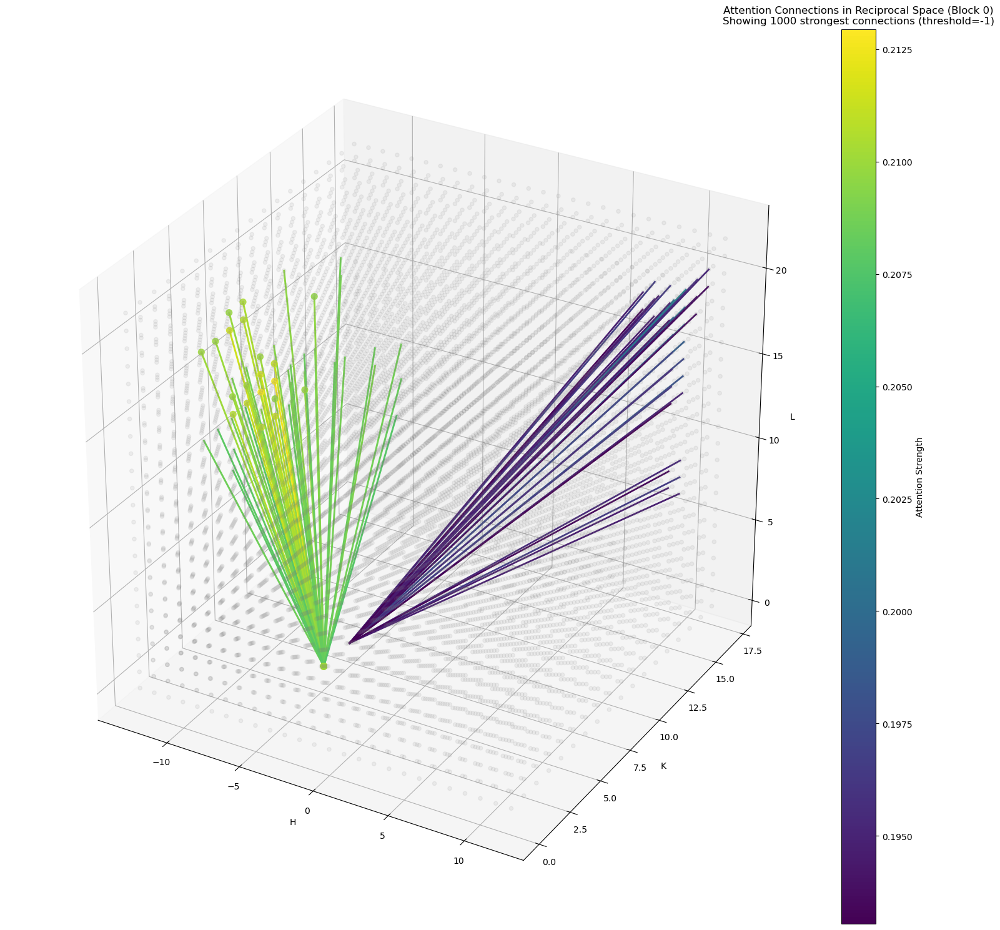


Attention Statistics:
Mean attention value: 0.1994
Max attention value: 0.2129
Min attention value: 0.1930
Plotting 1000 connections...


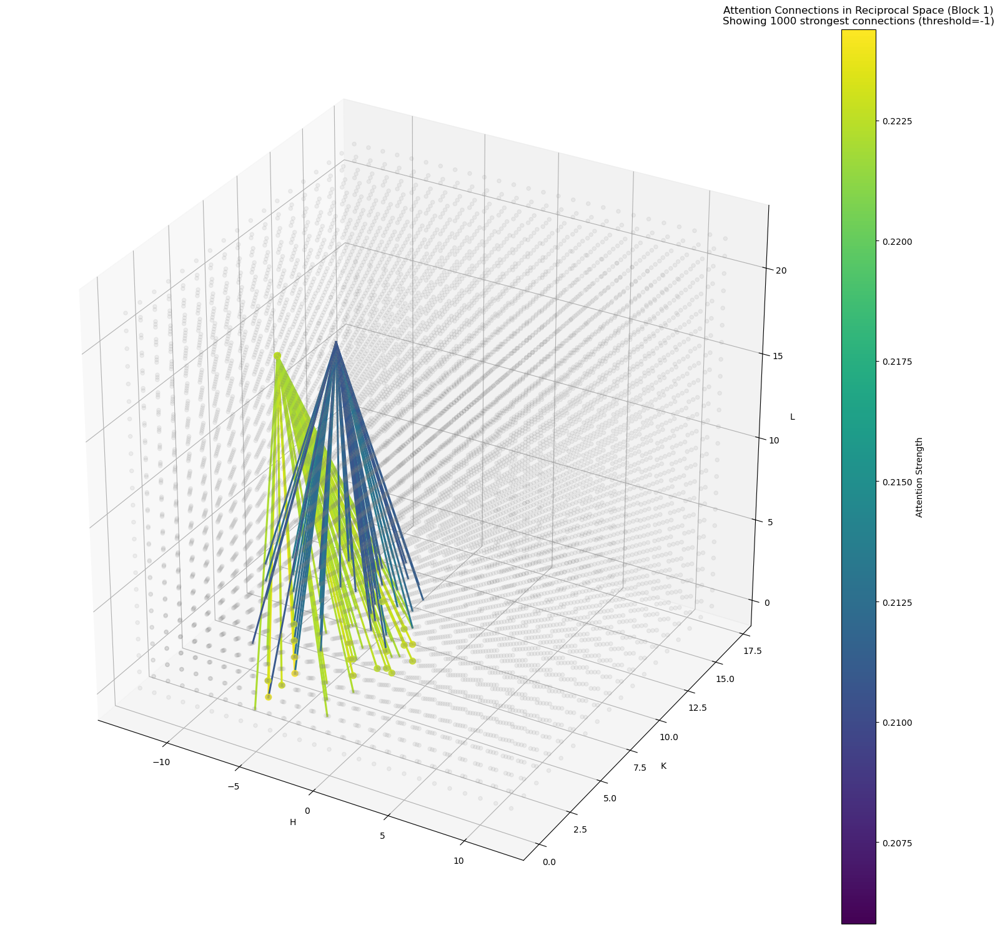


Attention Statistics:
Mean attention value: 0.2155
Max attention value: 0.2244
Min attention value: 0.2058
Plotting 1000 connections...


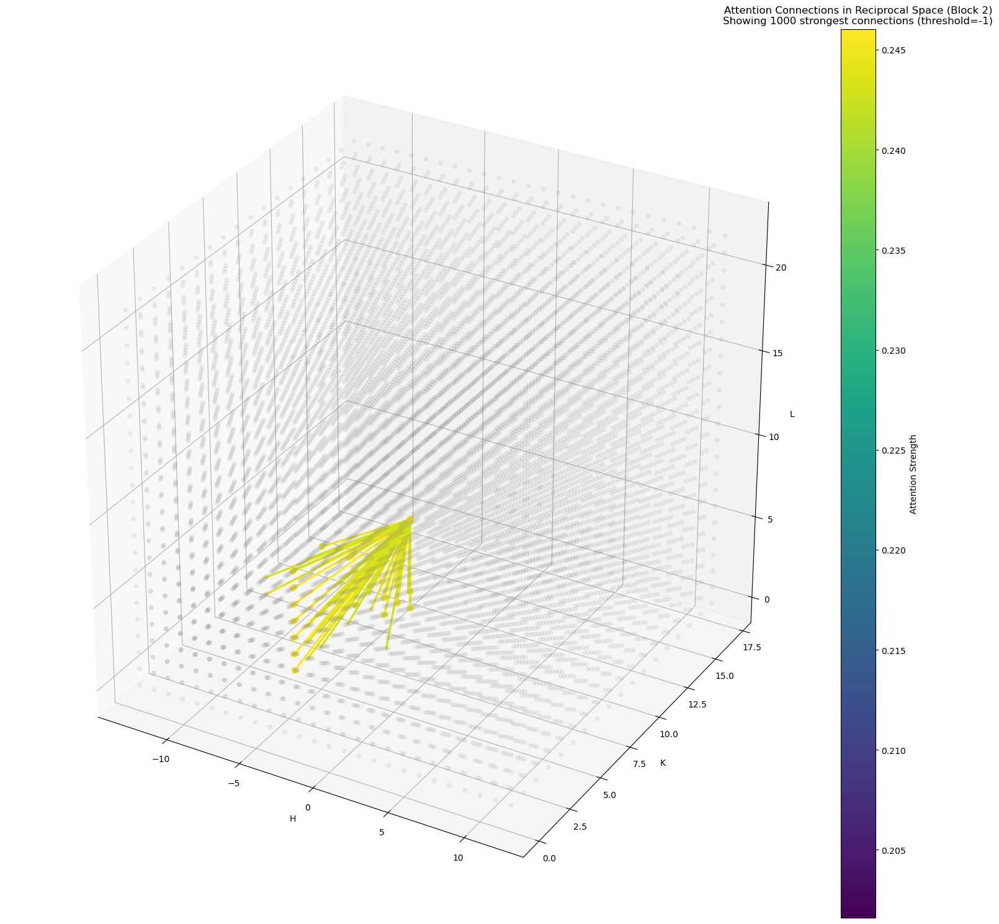


Attention Statistics:
Mean attention value: 0.2302
Max attention value: 0.2460
Min attention value: 0.2016
Plotting 1000 connections...


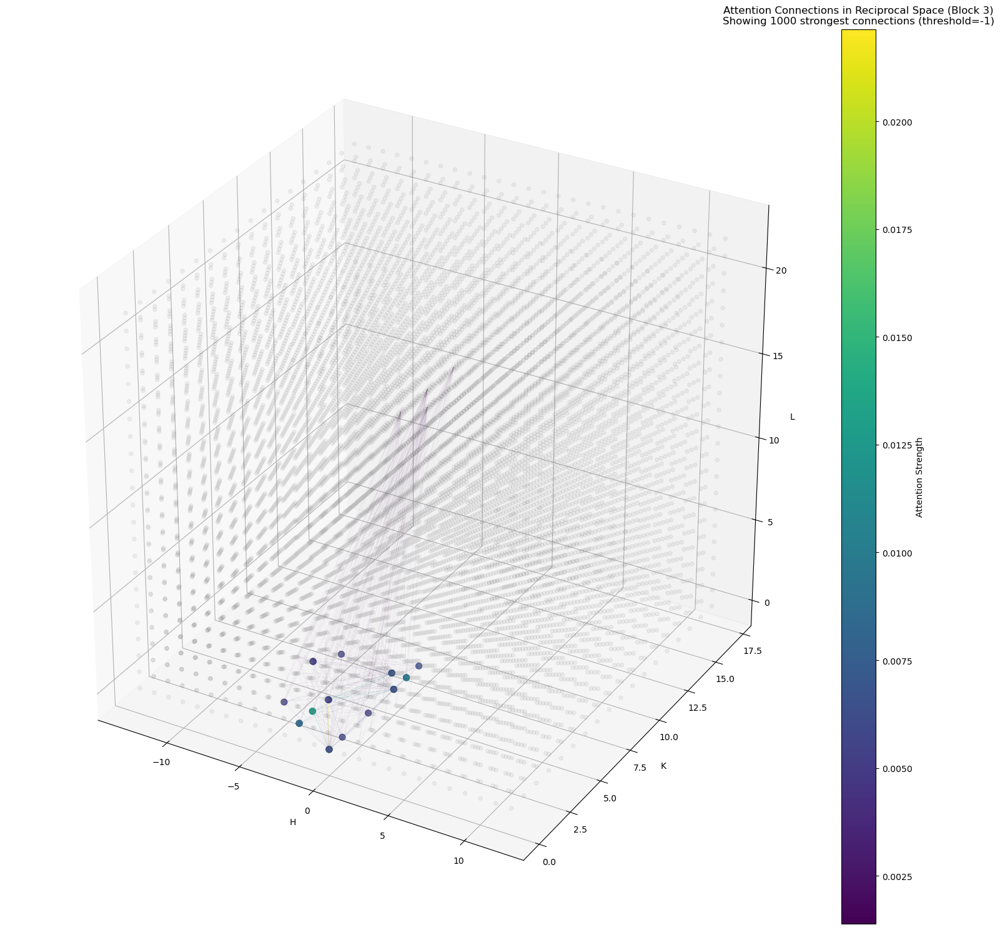


Attention Statistics:
Mean attention value: 0.0018
Max attention value: 0.0221
Min attention value: 0.0014
Plotting 1000 connections...


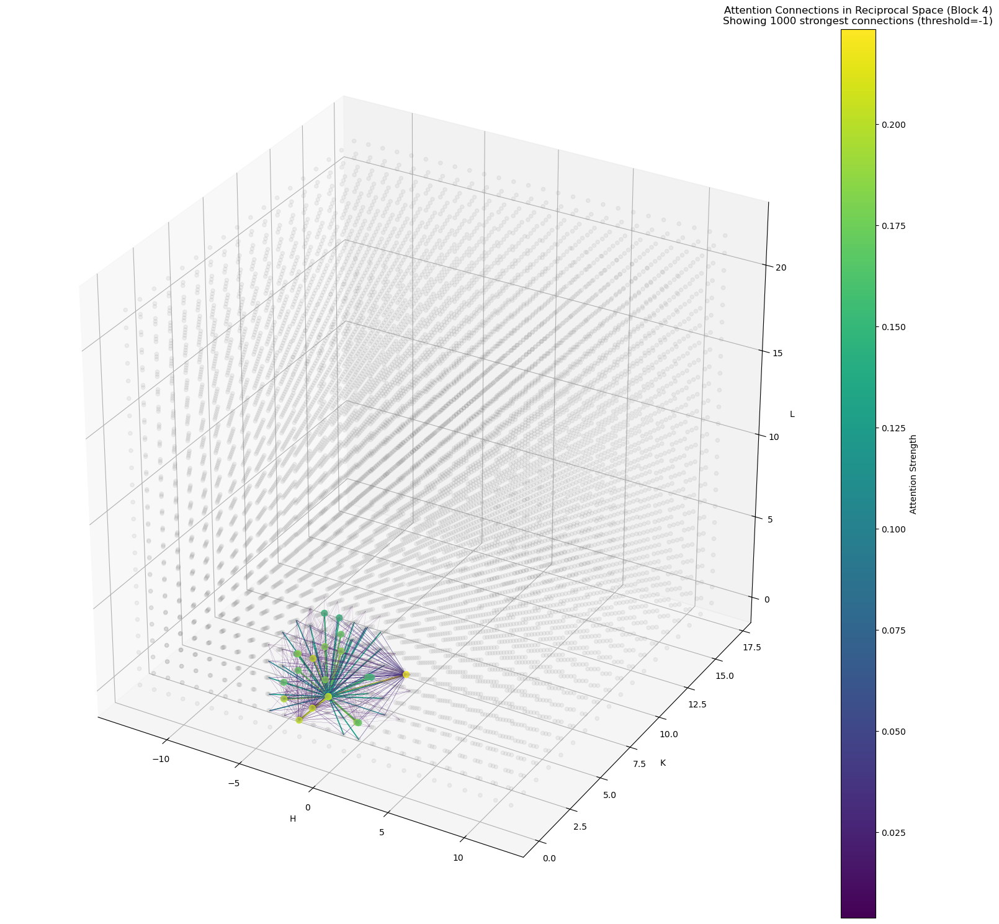


Attention Statistics:
Mean attention value: 0.0198
Max attention value: 0.2235
Min attention value: 0.0038


In [21]:
def plot_attention_connections_3d(attention_maps, h2ind, k2ind, l2ind, 
                                threshold=0.1,
                                max_connections=1000,
                                block_idx=0):
    # Setup 3D plot
    fig = plt.figure(figsize=(15, 15))
    gs = fig.add_gridspec(1, 20)
    ax = fig.add_subplot(gs[0, :19], projection='3d')
    cax = fig.add_subplot(gs[0, 19])
    
    # Get average attention for specified block
    avg_attn = attention_maps[block_idx].mean(dim=(0, 1)).cpu()
    
    # Get dimensions
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    
    # Create all HKL points
    all_points = []
    for h in h2ind.keys():
        for k in k2ind.keys():
            for l in l2ind.keys():
                all_points.append([h, k, l])
    all_points = np.array(all_points)
    
    # Plot all HKL points
    ax.scatter(all_points[:, 0], all_points[:, 1], all_points[:, 2], 
              c='gray', alpha=0.1, s=20)
    
    # Get attention values and find top connections
    values, indices = torch.topk(avg_attn.flatten(), min(max_connections, len(avg_attn.flatten())))
    mask = values > threshold
    
    if not mask.any():
        print(f"No attention values above threshold {threshold}.")
        print(f"Max attention value: {values.max():.4f}")
        print(f"Mean attention value: {values.mean():.4f}")
        print("Try lowering the threshold.")
        plt.close()
        return
    
    values = values[mask]
    indices = indices[mask]
    
    # Convert indices to source and target
    n_positions = avg_attn.shape[0]
    source_idx = indices // n_positions
    target_idx = indices % n_positions
    
    # Create colormap
    norm = plt.Normalize(values.min().item(), values.max().item())
    cmap = plt.cm.viridis
    
    # Plot connections
    print(f"Plotting {len(values)} connections...")
    
    # Count connections per point
    connection_counts = {}
    
    for i in range(len(values)):
        h1, k1, l1 = position_to_hkl(source_idx[i], h2ind, k2ind, l2ind)
        h2, k2, l2 = position_to_hkl(target_idx[i], h2ind, k2ind, l2ind)
        
        # Skip self-connections
        if (h1, k1, l1) == (h2, k2, l2):
            continue
            
        # Count connections
        point1 = (h1, k1, l1)
        point2 = (h2, k2, l2)
        connection_counts[point1] = connection_counts.get(point1, 0) + 1
        connection_counts[point2] = connection_counts.get(point2, 0) + 1
        
        # Only plot if points aren't too connected (prevent overcrowding)
        if connection_counts[point1] <= 50 and connection_counts[point2] <= 50:
            color = cmap(norm(values[i].item()))
            line = ax.plot([h1, h2], [k1, k2], [l1, l2], '-', 
                          color=color, linewidth=values[i].item()*10)
            
            # Add endpoints for strongest connections
            if i < 20:
                ax.scatter([h1, h2], [k1, k2], [l1, l2], 
                          color=color, s=50, alpha=0.8)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, cax=cax, label='Attention Strength')
    
    # Set labels and title
    ax.set_xlabel('H')
    ax.set_ylabel('K')
    ax.set_zlabel('L')
    plt.title(f'Attention Connections in Reciprocal Space (Block {block_idx})\n'
              f'Showing {len(values)} strongest connections (threshold={threshold})')
    
    # Optional: Add grid
    ax.grid(True, alpha=0.3)
    
    # Set equal aspect ratio
    ax.set_box_aspect([1,1,1])
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\nAttention Statistics:")
    print(f"Mean attention value: {values.mean():.4f}")
    print(f"Max attention value: {values.max():.4f}")
    print(f"Min attention value: {values.min():.4f}")

# Usage
for block_idx in range(len(attention_maps)):
    plot_attention_connections_3d(
        attention_maps, 
        h2ind, 
        k2ind, 
        l2ind,
        threshold=-1,  # Lower threshold to catch more connections
        max_connections=1000,
        block_idx=block_idx
    )

In [14]:
feature_maps = analyzer.visualize_feature_maps(low, layer_idx=1)
feature_maps.shape

torch.Size([1, 128, 13, 9, 11])

<Figure size 1200x800 with 0 Axes>

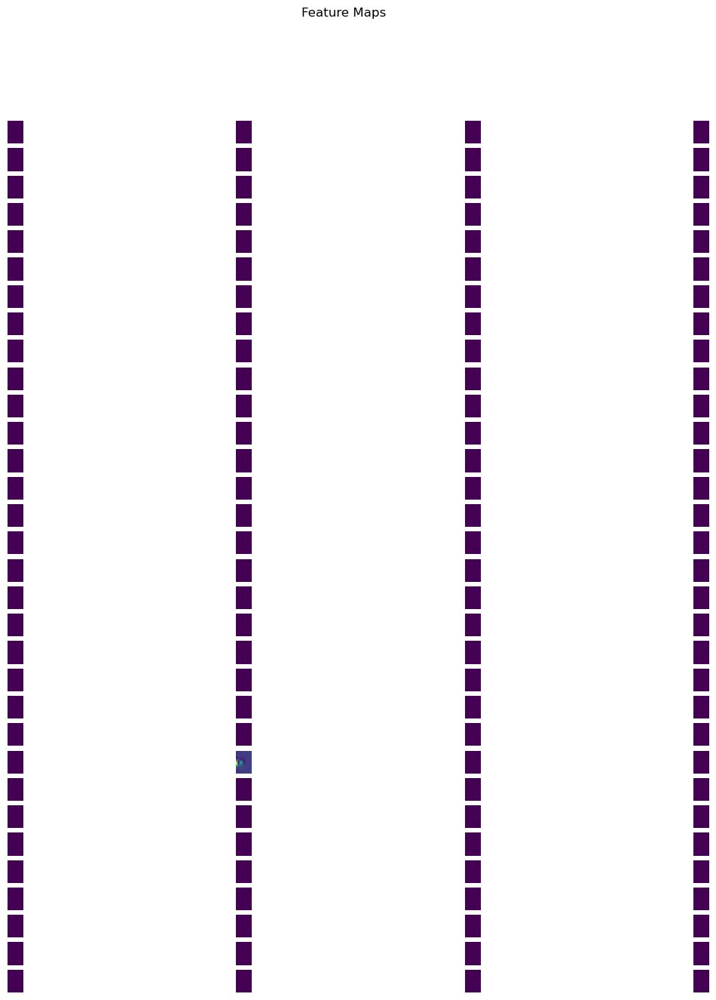

In [15]:
analyzer.plot_analysis('feature_maps', feature_maps)

In [16]:
background_data = torch.randn(low.shape)
shap_values = analyzer.compute_shap_values(background_data, low)
analyzer.plot_shap_summary(shap_values)

KeyboardInterrupt: 

<Figure size 1200x800 with 0 Axes>

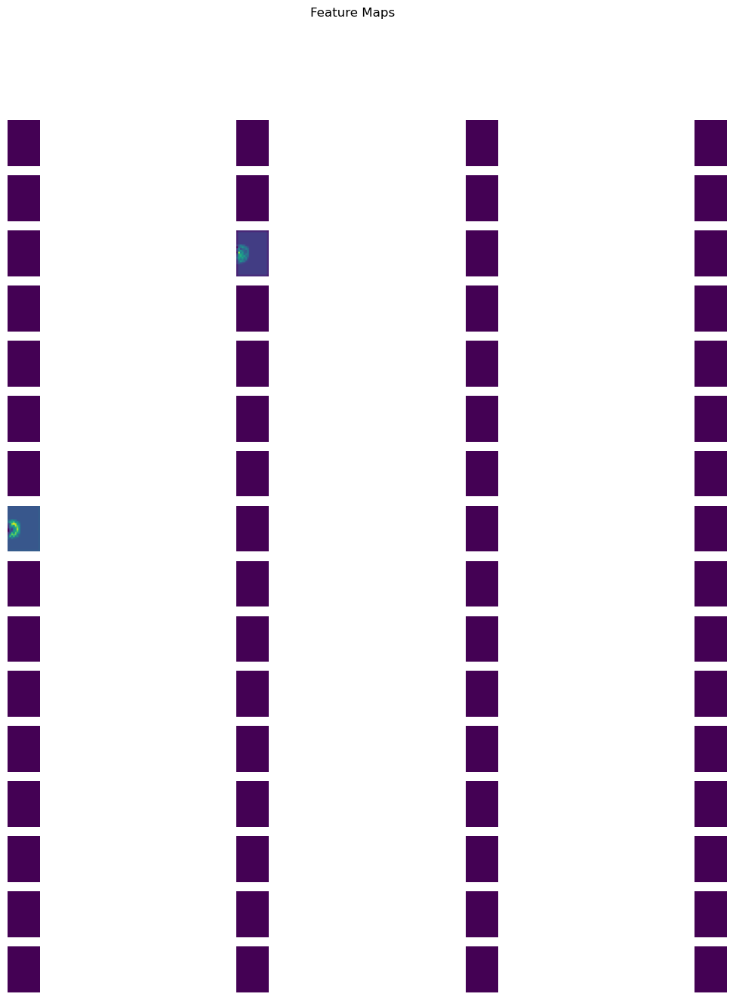

****************************************************************************************************


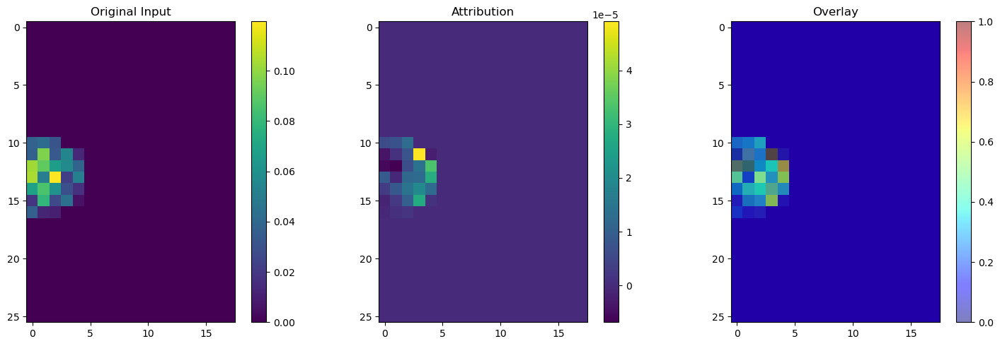

****************************************************************************************************


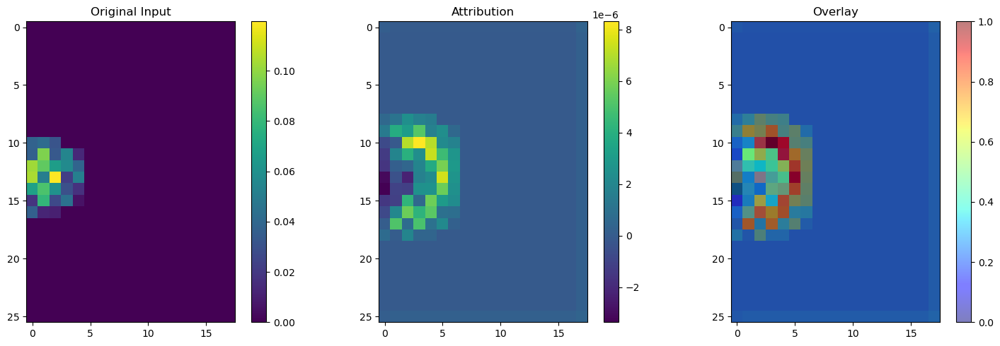

****************************************************************************************************


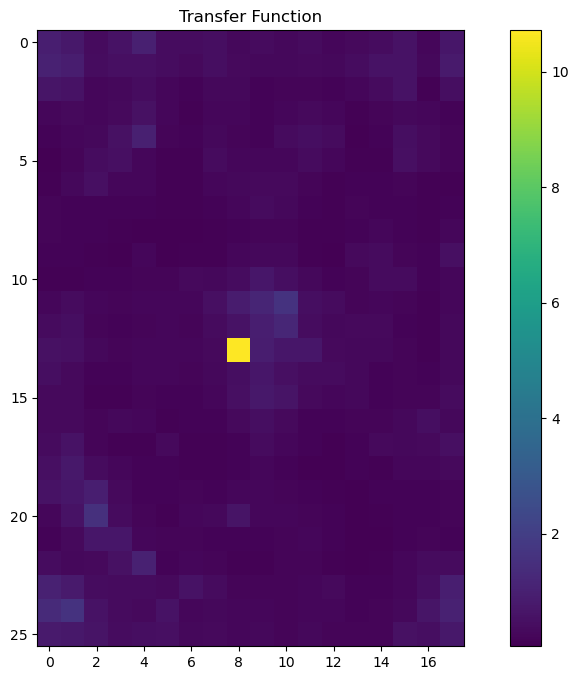

****************************************************************************************************


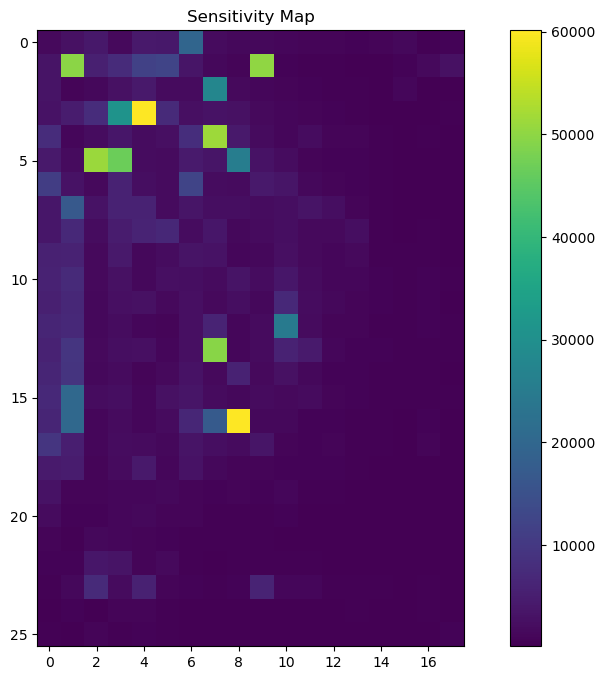

****************************************************************************************************
****************************************************************************************************


In [98]:
def run_comprehensive_analysis(analyzer, input_tensor):
    # 1. Feature maps
    feature_maps = analyzer.visualize_feature_maps(input_tensor, layer_idx=0)
    analyzer.plot_analysis('feature_maps', feature_maps)
    print('*'*100)
    # 2. Integrated gradients
    ig_attr = analyzer.compute_integrated_gradients(input_tensor)
    analyzer.plot_attribution_overlay(input_tensor, ig_attr)
    print('*'*100)
    # 3. GradCAM
    gradcam_attr = analyzer.compute_gradcam(input_tensor, target_layer='down1')
    analyzer.plot_attribution_overlay(input_tensor, gradcam_attr)
    print('*'*100)
    # 4. Frequency response
    freq_analysis = analyzer.analyze_frequency_response(input_tensor)
    analyzer.plot_analysis('frequency', freq_analysis)
    print('*'*100)
    # 5. Sensitivity
    sensitivity = analyzer.compute_sensitivity(input_tensor)
    analyzer.plot_analysis('sensitivity', sensitivity)
    print('*'*100)
    # 6. SHAP
    shap_values = analyzer.compute_shap_values(background_data, input_tensor)
    analyzer.plot_shap_summary(shap_values)
    print('*'*100)

# Run comprehensive analysis
run_comprehensive_analysis(analyzer, low)

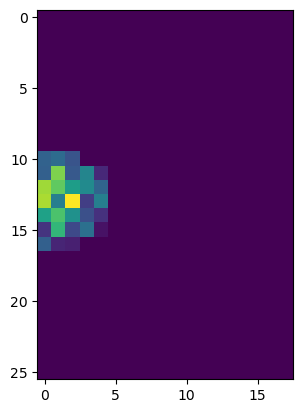

In [17]:
plt.imshow(low[0, 0].mean(-1))

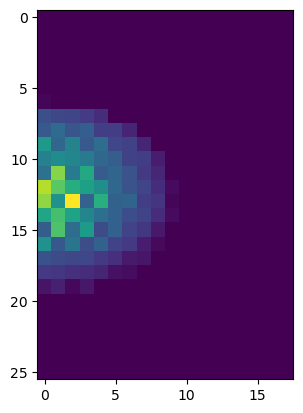

In [18]:
plt.imshow(high[0, 0].mean(-1))

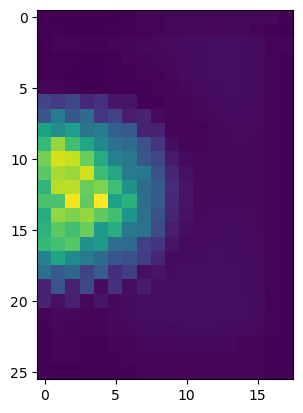

In [20]:
plt.imshow((F.relu(analyzer.model(low)).cpu().detach().numpy()[0, 0].mean(-1)))

In [8]:
analyzer.model(low)

NotImplementedError: Could not run 'aten::slow_conv3d_forward' with arguments from the 'CUDA' backend. This could be because the operator doesn't exist for this backend, or was omitted during the selective/custom build process (if using custom build). If you are a Facebook employee using PyTorch on mobile, please visit https://fburl.com/ptmfixes for possible resolutions. 'aten::slow_conv3d_forward' is only available for these backends: [CPU, Meta, BackendSelect, Python, FuncTorchDynamicLayerBackMode, Functionalize, Named, Conjugate, Negative, ZeroTensor, ADInplaceOrView, AutogradOther, AutogradCPU, AutogradCUDA, AutogradHIP, AutogradXLA, AutogradMPS, AutogradIPU, AutogradXPU, AutogradHPU, AutogradVE, AutogradLazy, AutogradMTIA, AutogradPrivateUse1, AutogradPrivateUse2, AutogradPrivateUse3, AutogradMeta, AutogradNestedTensor, Tracer, AutocastCPU, AutocastXPU, AutocastMPS, AutocastCUDA, FuncTorchBatched, BatchedNestedTensor, FuncTorchVmapMode, Batched, VmapMode, FuncTorchGradWrapper, PythonTLSSnapshot, FuncTorchDynamicLayerFrontMode, PreDispatch, PythonDispatcher].

CPU: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/build/aten/src/ATen/RegisterCPU.cpp:30476 [kernel]
Meta: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/MetaFallbackKernel.cpp:23 [backend fallback]
BackendSelect: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/BackendSelectFallbackKernel.cpp:3 [backend fallback]
Python: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/PythonFallbackKernel.cpp:153 [backend fallback]
FuncTorchDynamicLayerBackMode: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/DynamicLayer.cpp:497 [backend fallback]
Functionalize: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/FunctionalizeFallbackKernel.cpp:349 [backend fallback]
Named: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/NamedRegistrations.cpp:7 [backend fallback]
Conjugate: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/ConjugateFallback.cpp:17 [backend fallback]
Negative: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/native/NegateFallback.cpp:18 [backend fallback]
ZeroTensor: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/ZeroTensorFallback.cpp:86 [backend fallback]
ADInplaceOrView: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/VariableFallbackKernel.cpp:96 [backend fallback]
AutogradOther: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradCPU: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradCUDA: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradHIP: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradXLA: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradMPS: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradIPU: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradXPU: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradHPU: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradVE: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradLazy: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradMTIA: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradPrivateUse1: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradPrivateUse2: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradPrivateUse3: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradMeta: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
AutogradNestedTensor: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/VariableType_4.cpp:18915 [autograd kernel]
Tracer: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/torch/csrc/autograd/generated/TraceType_4.cpp:13465 [kernel]
AutocastCPU: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/autocast_mode.cpp:321 [backend fallback]
AutocastXPU: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/autocast_mode.cpp:463 [backend fallback]
AutocastMPS: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/autocast_mode.cpp:209 [backend fallback]
AutocastCUDA: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/autocast_mode.cpp:165 [backend fallback]
FuncTorchBatched: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/LegacyBatchingRegistrations.cpp:731 [backend fallback]
BatchedNestedTensor: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/LegacyBatchingRegistrations.cpp:758 [backend fallback]
FuncTorchVmapMode: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/VmapModeRegistrations.cpp:27 [backend fallback]
Batched: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/LegacyBatchingRegistrations.cpp:1075 [backend fallback]
VmapMode: fallthrough registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/VmapModeRegistrations.cpp:33 [backend fallback]
FuncTorchGradWrapper: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/TensorWrapper.cpp:207 [backend fallback]
PythonTLSSnapshot: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/PythonFallbackKernel.cpp:161 [backend fallback]
FuncTorchDynamicLayerFrontMode: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/functorch/DynamicLayer.cpp:493 [backend fallback]
PreDispatch: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/PythonFallbackKernel.cpp:165 [backend fallback]
PythonDispatcher: registered at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/core/PythonFallbackKernel.cpp:157 [backend fallback]


In [99]:
# Example analysis code
def analyze_frequency_response(freq_data):
    transfer_func = freq_data['transfer_function'][0, 0].mean(-1)
    
    # Get statistics
    mean_response = transfer_func.mean().item()
    max_response = transfer_func.max().item()
    min_response = transfer_func.min().item()
    
    print(f"Mean frequency response: {mean_response:.3f}")
    print(f"Response range: {min_response:.3f} to {max_response:.3f}")
    
    # Identify dominant frequencies
    high_response_mask = transfer_func > (mean_response + transfer_func.std())
    print(f"Percentage of high-response frequencies: {100 * high_response_mask.sum() / transfer_func.numel():.1f}%")

In [100]:
def analyze_sensitivity(sensitivity_map):
    sens = sensitivity_map[0, 0].mean(-1)
    
    # Basic statistics
    mean_sens = sens.mean().item()
    max_sens = sens.max().item()
    
    # Find highly sensitive regions
    high_sens_threshold = mean_sens + sens.std()
    high_sens_regions = (sens > high_sens_threshold).sum().item()
    
    print(f"Mean sensitivity: {mean_sens:.3f}")
    print(f"Max sensitivity: {max_sens:.3f}")
    print(f"Number of highly sensitive regions: {high_sens_regions}")

In [101]:
def analyze_gradcam(input_tensor, gradcam_attr):
    # Normalize attribution
    attr = gradcam_attr[0, 0].mean(-1)
    attr_norm = (attr - attr.min()) / (attr.max() - attr.min())
    
    # Find important regions
    important_threshold = 0.7  # Adjust based on your needs
    important_regions = (attr_norm > important_threshold).sum().item()
    
    # Compare with input features
    input_features = input_tensor[0, 0].mean(-1)
    correlation = torch.corrcoef(
        torch.stack([attr_norm.flatten(), input_features.flatten()])
    )[0,1].item()
    
    print(f"Number of important regions: {important_regions}")
    print(f"Correlation with input features: {correlation:.3f}")

In [102]:
def comprehensive_analysis(analyzer, input_tensor):
    # Get all analyses
    freq_response = analyzer.analyze_frequency_response(input_tensor)
    sensitivity = analyzer.compute_sensitivity(input_tensor)
    gradcam = analyzer.compute_gradcam(input_tensor, target_layer='down1')
    
    print("=== Frequency Response Analysis ===")
    analyze_frequency_response(freq_response)
    
    print("\n=== Sensitivity Analysis ===")
    analyze_sensitivity(sensitivity)
    
    print("\n=== GradCAM Analysis ===")
    analyze_gradcam(input_tensor, gradcam)
    
    # Plot correlation between different analyses
    sens_vs_gradcam = torch.corrcoef(
        torch.stack([
            sensitivity[0, 0].mean(-1).flatten(),
            gradcam[0, 0].mean(-1).flatten()
        ])
    )[0,1].item()
    
    print(f"\nCorrelation between sensitivity and GradCAM: {sens_vs_gradcam:.3f}")

In [103]:
comprehensive_analysis(analyzer, low)

=== Frequency Response Analysis ===
Mean frequency response: 0.329
Response range: 0.051 to 10.717
Percentage of high-response frequencies: 4.3%

=== Sensitivity Analysis ===
Mean sensitivity: 3180.809
Max sensitivity: 82523.305
Number of highly sensitive regions: 19

=== GradCAM Analysis ===
Number of important regions: 13
Correlation with input features: -0.027

Correlation between sensitivity and GradCAM: -0.036


In [16]:
def create_hkl_indices(h2ind, k2ind, l2ind):
    """
    Create mapping between sequence positions and HKL indices
    
    Args:
        h2ind, k2ind, l2ind: Dictionaries mapping h,k,l values to indices
    Returns:
        List of (h,k,l) tuples for each position in the sequence
    """
    # Reverse the index mappings
    ind2h = {v: k for k, v in h2ind.items()}
    ind2k = {v: k for k, v in k2ind.items()}
    ind2l = {v: k for k, v in l2ind.items()}
    
    # Get dimensions
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    
    # Create position to HKL mapping
    hkl_indices = []
    for h in range(H):
        for k in range(K):
            for l in range(L):
                hkl_indices.append((ind2h[h], ind2k[k], ind2l[l]))
    
    return hkl_indices

def position_to_hkl(position, h2ind, k2ind, l2ind):
    """
    Convert flattened position back to HKL indices
    
    Args:
        position: Flattened position index
        h2ind, k2ind, l2ind: Index mapping dictionaries
    Returns:
        (h,k,l) tuple of actual HKL values
    """
    # Get dimensions
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    # Convert tensor to integer if needed
    if torch.is_tensor(position):
        position = position.item()
    
    # Reverse the index mappings
    ind2h = {v: k for k, v in h2ind.items()}
    ind2k = {v: k for k, v in k2ind.items()}
    ind2l = {v: k for k, v in l2ind.items()}
    
    # Convert position to indices
    # The order matches the transformer's flattening:
    # position = h * (K * L) + k * L + l
    h_idx = position // (K * L)
    k_idx = (position % (K * L)) // L
    l_idx = position % L

    # Ensure indices are within bounds
    if h_idx >= H or k_idx >= K or l_idx >= L:
        raise ValueError(f"Position {position} is out of bounds for grid size {H}x{K}x{L}")
    
    # Convert indices to actual HKL values
    h = ind2h[h_idx]
    k = ind2k[k_idx]
    l = ind2l[l_idx]
    
    return h, k, l

# Create the indices mapping
hkl_indices = create_hkl_indices(h2ind, k2ind, l2ind)

def analyze_attention_crystallography(attention_maps, h2ind, k2ind, l2ind, low):
    """
    Analyze attention patterns in crystallographic context
    
    Args:
        attention_maps: List of attention tensors
        h2ind, k2ind, l2ind: Dictionaries mapping h,k,l values to indices
        low: Input tensor containing intensity values
    """
    # Get grid shape
    H, K, L = len(h2ind), len(k2ind), len(l2ind)
    
    for block_idx, attn in enumerate(attention_maps):
        print(f"\n=== Block {block_idx} Analysis ===")
        avg_attn = attn.mean(dim=(0, 1))  # Average over batch and heads
        
        # 1. Find strongest attention pairs
        values, indices = torch.topk(avg_attn.view(-1), 30)
        rows = indices // (H * K * L)
        cols = indices % (H * K * L)
        
        print("Strongest attention connections:")
        for i in range(30):
            # Convert positions to HKL indices
            h1, k1, l1 = position_to_hkl(rows[i], h2ind, k2ind, l2ind)
            h2, k2, l2 = position_to_hkl(cols[i], h2ind, k2ind, l2ind)
            
            # Get intensities
            int1 = low[0, 0, h2ind[h1], k2ind[k1], l2ind[l1]].item()
            int2 = low[0, 0, h2ind[h2], k2ind[k2], l2ind[l2]].item()
            
            print(f"\nConnection {i+1}:")
            print(f"({h1},{k1},{l1}) -> ({h2},{k2},{l2})")
            print(f"Attention weight: {values[i]:.3f}")
            print(f"Intensities: {int1:.3f} -> {int2:.3f}")
            
            # Calculate distance in reciprocal space
            d = np.sqrt((h1-h2)**2 + (k1-k2)**2 + (l1-l2)**2)
            print(f"Distance in reciprocal space: {d:.3f}")
        
        # 2. Analyze symmetry relationships
        print("\nSymmetry Analysis:")
        symmetric_pairs = []
        for h in h2ind.keys():
            for k in k2ind.keys():
                for l in l2ind.keys():
                    # Check if symmetric reflection exists
                    if (-h in h2ind) and (-k in k2ind) and (-l in l2ind):
                        pos1 = h2ind[h] * (K * L) + k2ind[k] * L + l2ind[l]
                        pos2 = h2ind[-h] * (K * L) + k2ind[-k] * L + l2ind[-l]
                        symmetric_pairs.append((pos1, pos2))
        
        if symmetric_pairs:
            sym_attention = [avg_attn[pos1, pos2].item() for pos1, pos2 in symmetric_pairs]
            print(f"Mean attention between symmetric pairs: {np.mean(sym_attention):.3f}")
            print(f"Max attention between symmetric pairs: {np.max(sym_attention):.3f}")

# Usage
attention_maps = analyzer.analyze_attention_patterns(low)
analyze_attention_crystallography(attention_maps, h2ind, k2ind, l2ind, low)

TypeError: Invalid shape () for image data

<Figure size 1200x800 with 0 Axes>

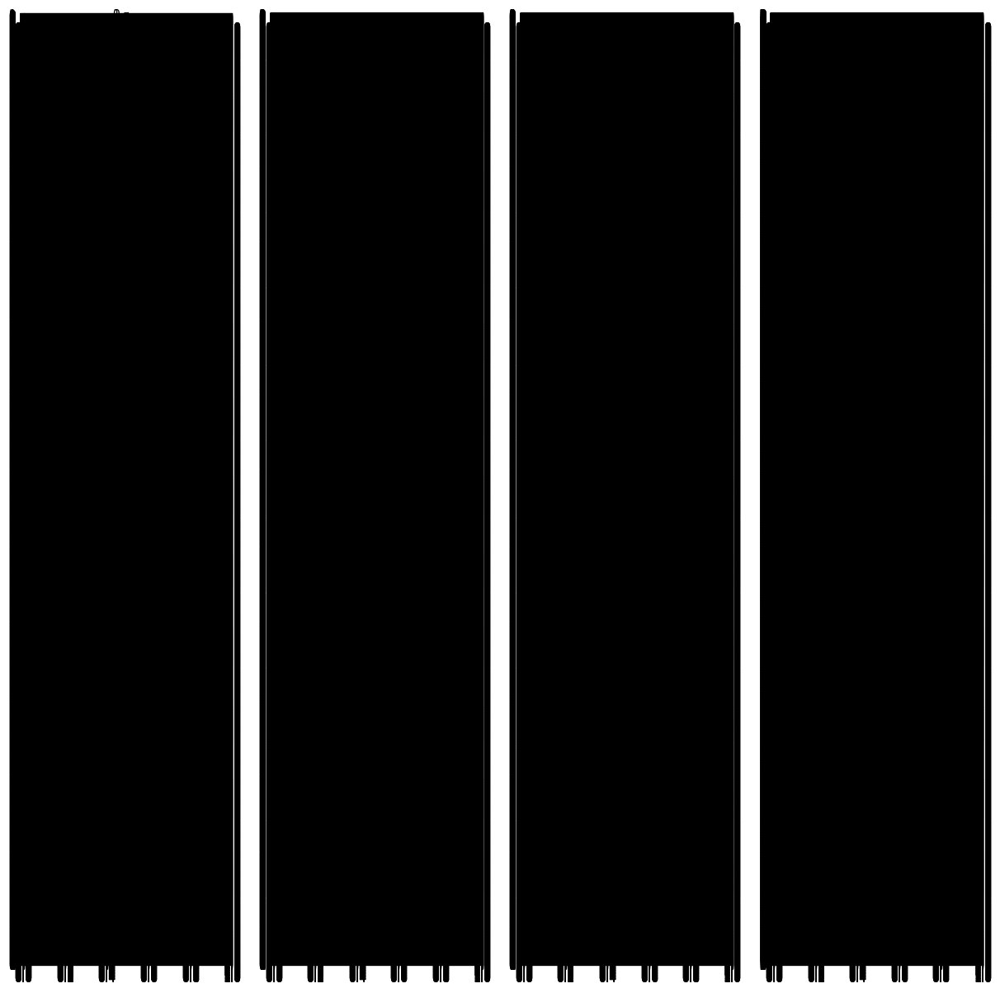

In [12]:
def run_comprehensive_analysis(analyzer, input_tensor):
    # 1. Feature maps
    feature_maps = analyzer.visualize_feature_maps(input_tensor, layer_idx=0)
    analyzer.plot_analysis('feature_maps', feature_maps)
    print('*'*100)
    # 2. Integrated gradients
    ig_attr = analyzer.compute_integrated_gradients(input_tensor)
    analyzer.plot_attribution_overlay(input_tensor, ig_attr)
    print('*'*100)
    # 3. GradCAM
    gradcam_attr = analyzer.compute_gradcam(input_tensor, target_layer='down1')
    analyzer.plot_attribution_overlay(input_tensor, gradcam_attr)
    print('*'*100)
    # 4. Frequency response
    freq_analysis = analyzer.analyze_frequency_response(input_tensor)
    analyzer.plot_analysis('frequency', freq_analysis)
    print('*'*100)
    # 5. Sensitivity
    sensitivity = analyzer.compute_sensitivity(input_tensor)
    analyzer.plot_analysis('sensitivity', sensitivity)
    print('*'*100)
    # 6. SHAP
    shap_values = analyzer.compute_shap_values(background_data, input_tensor)
    analyzer.plot_shap_summary(shap_values)
    print('*'*100)

# Run comprehensive analysis
run_comprehensive_analysis(analyzer, low)